In [3]:
import os
from statsmodels.distributions.empirical_distribution import ECDF 
import scipy.stats as stats
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
from pathlib import Path
import pickle
from concurrent.futures import ThreadPoolExecutor
from datetime import datetime

In [4]:
DATASET_LOCATION = "../datasets/"
# 5 selected edge nodes
dc_ids = ['shanghai-telecom', 'wuxi-telecom_unicom_cmcc', 'suzhou-telecom', 'wuhan-telecom', 'xiamen-telecom']
# 10 selected regions
region_ids = ['shanghai-telecom-2', 'wuxi-telecom-2', 'suzhou-telecom-2', 'wuhan-telecom-3', 'xiamen-telecom_unicom_cmcc', 'jinan-telecom', 'wuhu-telecom', 'qingdao-telecom', 'wenzhou-telecom', 'hangzhou-telecom']
# list of distributions to demonstrate their performance
distributions_to_test = ['beta', 'burr12', 'fatiguelife', 'fisk', 'expon', 'gamma', 'genextreme', 
                'genpareto', 'invgauss', 'logistic', 'lognorm', 'nakagami',
                'rice', 'rayleigh', 't']


In [5]:
def save_fit_results(region_id, fit_results):
    my_file = Path(f"../datasets/split-rtt-files/cleandata/all-dist/{region_id}.pickle")
    if not my_file.is_file():
        with open(f"../datasets/split-rtt-files/cleandata/all-dist/{region_id}.pickle", 'wb') as file_handle:
            pickle.dump(fit_results, file_handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        raise Exception(f'The file fit_result_reg{region_id}.pickle already exists')

In [6]:
# Open results from file

def open_fit_results(region_id):
    with open(f"../datasets/split-rtt-files/cleandata/all-dist/{region_id}.pickle", 'rb') as file_handle:
        fit_results = pickle.load(file_handle)
    return fit_results

In [7]:
# filter out one-way RTT values for each pair of regions and edge nodes in one week (from 2020-05-31 to 2020-06-07),
# clean data is extracted from the dataset and saved in /split-rtt-files/cleandata/from-{}-to-{}.csv

def get_rtt_values_for_each_pair(region_id, dc_id):
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/split-rtt-files/cleandata/from-{}-to-{}.csv".format(region_id, dc_id))
    start_time = pd.to_datetime('2020-05-31 16:00:00', utc=True)
    end_time = pd.to_datetime('2020-06-07 16:00:00', utc=True)
    df["biz_ts"] = pd.to_datetime(df['biz_ts'], unit='s', utc=True)
    df = df[(df["biz_ts"]>=start_time) & (df["biz_ts"]<=end_time)]
    
    rtt_values = df["rtt"].values
    rtt_values_without_nan = rtt_values[~pd.isnull(rtt_values)] # get rid of the null values
    return list(rtt_values_without_nan)

In [8]:
# This function is used to fit for each pair of regions and edge nodes for each distribution method
# In order to demonstrate the accuracy of the distribution method with the parameters, samples are generated 1000
# times for calculating p-value.

# As a result, it will create a pdf plot for the best fit.

def fit_distribution(dist_name, y, x, num_simulations):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        dist = getattr(stats, dist_name)
        params = dist.fit(y)
        d0  = stats.kstest(y, dist_name, args=params)[0]

        simulated_statistics = []
        flag_sample_null = 0 # a flag that marks if sample contains infinite values
        
        for _ in range(num_simulations):
            sample = dist.rvs(*params, size=len(y))
            
            # In some samples, there might exist infinite values, so here we need to get rid of them.
            if np.all(np.isfinite(sample)):
                sample_without_null = sample
            else:
                flag_sample_null = 1
                sample_without_null = sample[np.isfinite(sample)]
            
            params2 = dist.fit(sample_without_null)
            simulated_statistic = stats.kstest(sample_without_null, dist_name, args=params2)[0]
            simulated_statistics.append(simulated_statistic)

        print(dist_name, flag_sample_null)
        p_value = np.mean(d0 <= np.array(simulated_statistics))
        arg = params[:-2]
        loc = params[-2]
        scale = params[-1]
        pdf_fitted = dist.pdf(x, *arg, loc=loc, scale=scale)

    return dist_name, d0, p_value, {'loc': loc, 'scale': scale, 'arg': arg}, pdf_fitted


In [9]:
import warnings

"""
Fitting distributions to data based on Stackoverflow answer:
https://stackoverflow.com/a/16651955/2087463

Monte Carlo simulation for computing p-values based on pseudocode from:
https://medium.com/@pabaldonedo/kolmogorov-smirnov-test-may-not-be-doing-what-you-think-when-parameters-are-estimated-from-the-data-2d5c3303a020

Common distributions list:
Beta, Birnbaum-Saunders (=fatiguelife), Gamma, Generalized Extreme Value, 
Generalized Pareto, Inverse Gaussian, Logistic, Log-logistic (=fisk), Lognormal, Nakagami,
alpha-stable (=levy_stable), Rayleigh, Rician (=rice), t Location-scale (=t) and Burr Type 12. 

p-values generated from using Kolmogorov-Smirnov test with Monte Carlo simulation are used to define which distributions 
are the 5 best fits for the data.
"""

# This function is used to return the best parameters of different distributions for each edge node.
# It will create 10 plots in total, representing the 10 pairs of this edge node and the 10 regions.
# For each plot, it will show all the distribution methods with the best fit.
# These parameters will be saved in "best_fits"

def fit_distributions_mc(probe_region_id, data, distributions_to_test, num_simulations):
    plt.figure(figsize=(12,9))
    y = data
    print(np.all(np.isfinite(y)))
    # It will plot a histogram for the original data first.
    x = np.linspace(start=min(y), stop=max(y), num=60)
    plt.hist(y, 100, density=True)
    bottom, top = plt.ylim()

    dist_names = distributions_to_test
    num_simulations = num_simulations # Number of Monte Carlo simulations

    best_fits = {}
    
    # To improve the efficiency of execution, code is organized in a concurrent way.
    with ThreadPoolExecutor() as executor:
        futures = [executor.submit(fit_distribution, dist_name, y, x, num_simulations) for dist_name in distributions_to_test]
        for future in futures:
            dist_name, d0, p_value, params, pdf_fitted = future.result()
            best_fits[dist_name] = [[d0, p_value], params]
            plt.plot(x, pdf_fitted, label=dist_name)
            plt.ylim(bottom, top)

    
    plt.legend(loc='upper right')
    plt.xlabel(f'RTTs from probe region {probe_region_id}')
    plt.ylabel('CDF')
    plt.show()

    return best_fits


In [10]:
# This is the entry for one edge node to find the best fits of a list of distribution methods.
# Multiple processes are started at the same time. It takes 2.5-3 hours for an 8-core laptop to finish execution.

def calculate_best_fits_for_region_mc(dc_id, distributions_to_test, number_of_simulations):
    best_fits_p_values = []
    for region_id in region_ids:
        print(f"-----------region id: {region_id}-------------")
        rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
        best_fits_p_values.append((region_id, fit_distributions_mc(region_id, rtt_values, distributions_to_test, number_of_simulations)))
    return best_fits_p_values

-----------region id: shanghai-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
t 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
nakagami 0
rice 0
genpareto 0
burr12 1
genextreme 0
fisk 0
beta 0


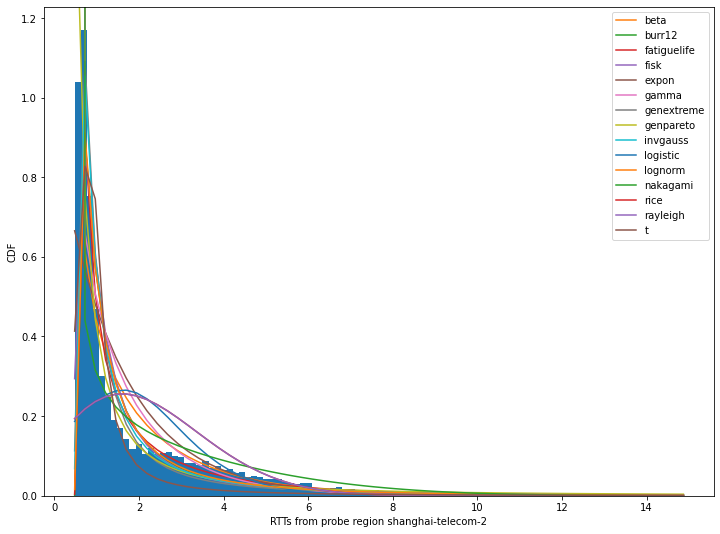

-----------region id: wuxi-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
gamma 0
lognorm 0
t 0
nakagami 0
rice 0
genextreme 0
genpareto 0
beta 0
burr12 0
fisk 0


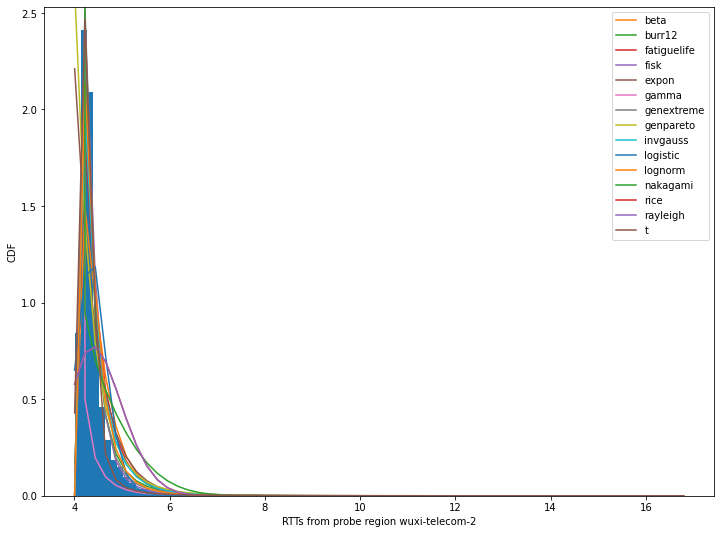

-----------region id: suzhou-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
t 0
nakagami 0
rice 0
genpareto 0
beta 0
genextreme 0
burr12 1
fisk 0


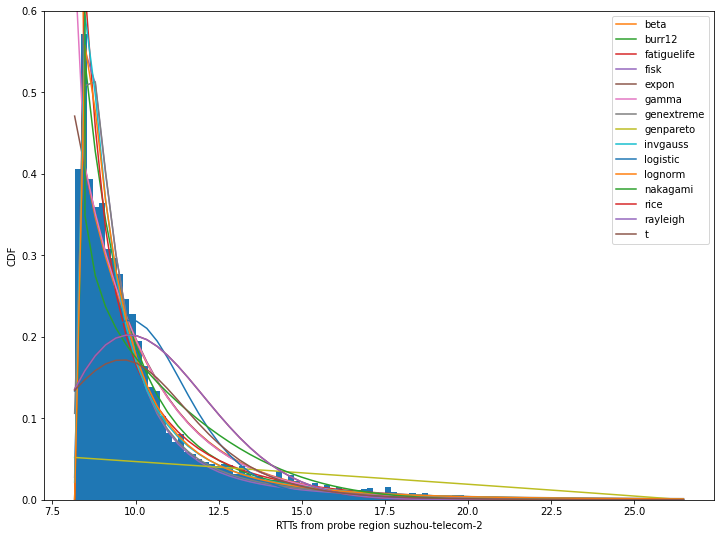

-----------region id: wuhan-telecom-3-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
gamma 0
invgauss 0
lognorm 0
nakagami 0
fisk 0
t 0
rice 0
beta 0
genpareto 0
genextreme 0
burr12 1


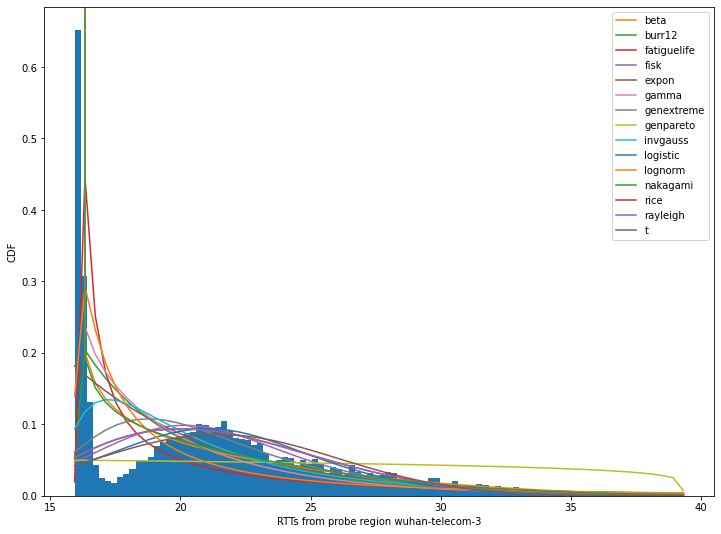

-----------region id: xiamen-telecom_unicom_cmcc-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
t 0
nakagami 0
rice 0
beta 0
genpareto 0
burr12 1
genextreme 0
fisk 0


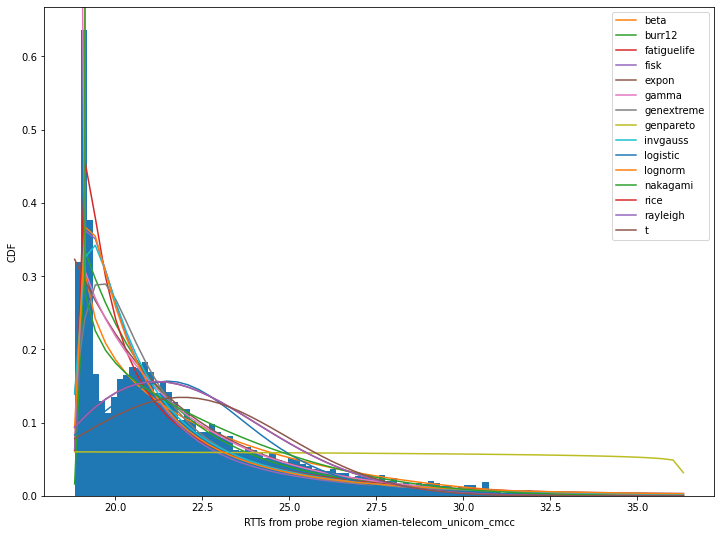

-----------region id: jinan-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
invgauss 0
nakagami 0
fatiguelife 0
t 0
rice 0
lognorm 0
beta 0
genpareto 0
burr12 0
genextreme 0
fisk 0


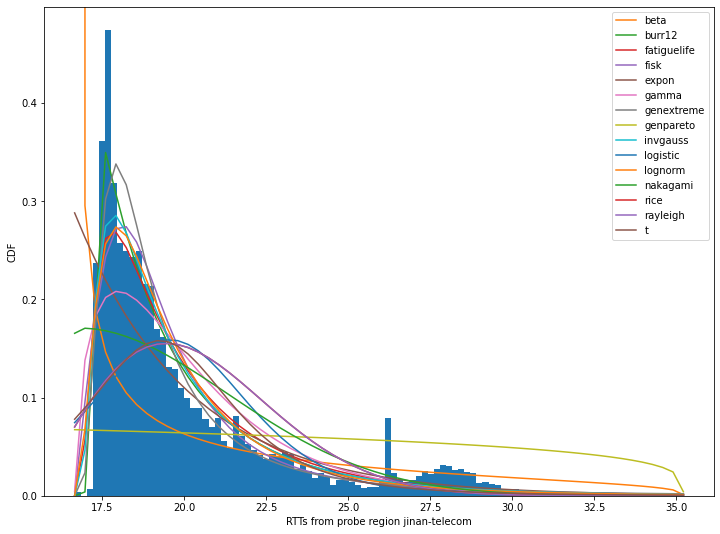

-----------region id: wuhu-telecom-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
invgauss 0
lognorm 0
t 0
gamma 0
nakagami 0
rice 0
burr12 1
genextreme 0
beta 0
genpareto 0
fisk 0


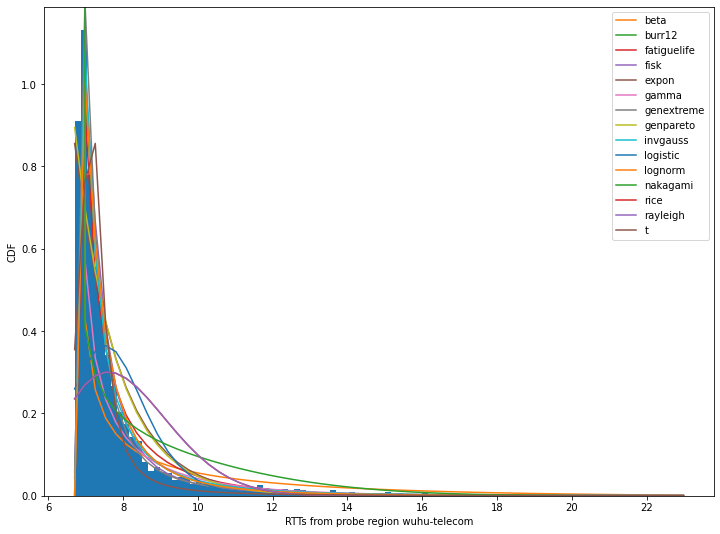

-----------region id: qingdao-telecom-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
t 0
nakagami 0
rice 0
beta 0
genpareto 0
burr12 1
genextreme 0
fisk 0


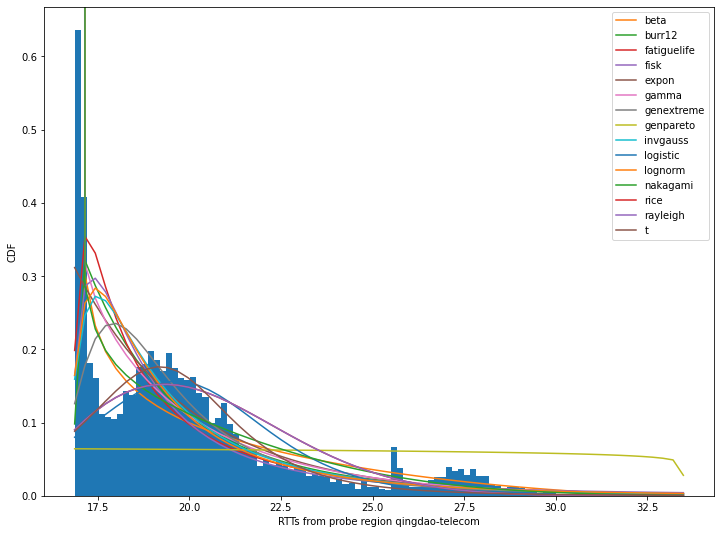

-----------region id: wenzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
nakagami 0
t 0
rice 0
beta 0
burr12 1
genextreme 0
genpareto 0
fisk 0


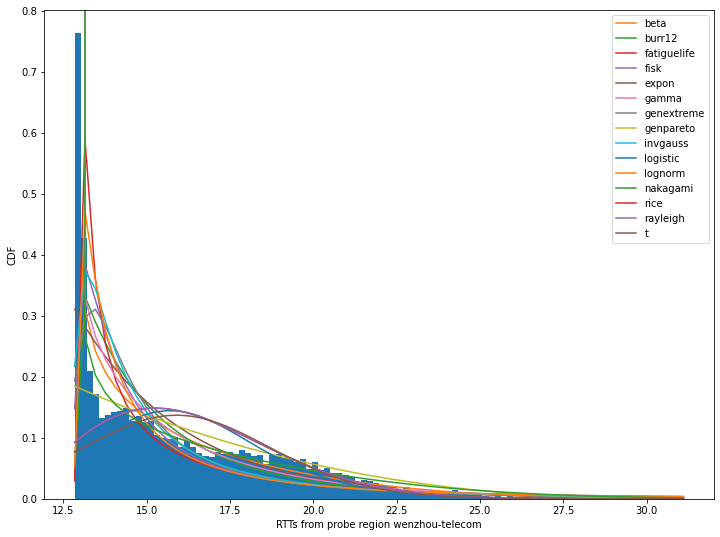

-----------region id: hangzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
t 0
rice 0
nakagami 0
beta 0
genpareto 0
burr12 1
genextreme 0
fisk 0


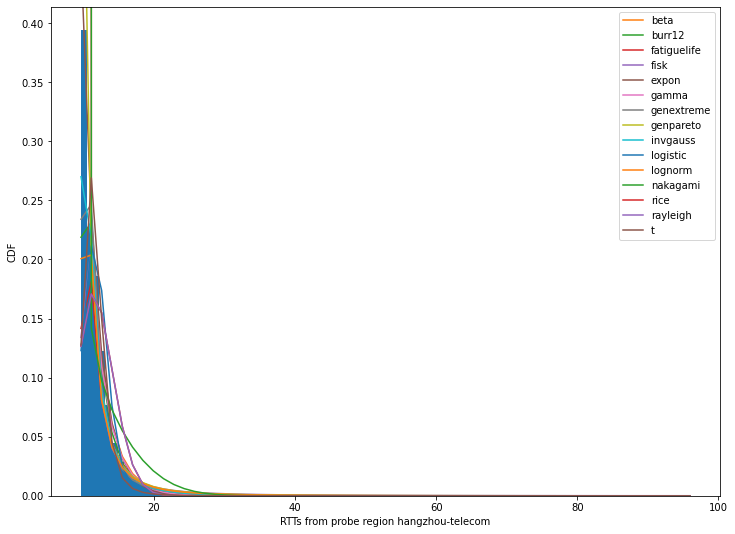

In [30]:
# edge node 1: shanghai-telecom
best_fits_p_values_for_reg1 = calculate_best_fits_for_region_mc('shanghai-telecom', distributions_to_test, 1000)

In [32]:
# print out the result of execution
best_fits_p_values_for_shanghai_telecom = best_fits_p_values_for_reg1
print(best_fits_p_values_for_shanghai_telecom)
# save the result into "../datasets/split-rtt-files/cleandata/all-dist/shanghai-telecom.pickle"
save_fit_results("shanghai-telecom", best_fits_p_values_for_shanghai_telecom)

[('shanghai-telecom-2', {'beta': [[0.11105356922171922, 0.076], {'loc': 0.47659999999999997, 'scale': 178.59257149974457, 'arg': (0.7209383464437104, 85.6192804948009)}], 'burr12': [[0.06718115107121159, 0.0], {'loc': -0.5171767853551545, 'scale': 1.0220293688252826, 'arg': (261.7533815567714, 0.005606333577138953)}], 'fatiguelife': [[0.04006094179248365, 0.0], {'loc': 0.4630782015415982, 'scale': 0.682254432880566, 'arg': (1.5658723318311474,)}], 'fisk': [[0.06697865457711416, 0.014], {'loc': 0.4765439701844888, 'scale': 0.651275199110199, 'arg': (1.1956602420018343,)}], 'expon': [[0.18238310498661098, 0.0], {'loc': 0.4766, 'scale': 1.502884988590138, 'arg': ()}], 'gamma': [[0.1119760299834831, 0.001], {'loc': 0.47659999999999997, 'scale': 1.5214303100951496, 'arg': (0.8524290754916009,)}], 'genextreme': [[0.07362084629256926, 0.0], {'loc': 0.838038292451298, 'scale': 0.44850762785510756, 'arg': (-1.0957735775257107,)}], 'genpareto': [[0.12034151336242449, 0.035], {'loc': 0.4765999995

In [39]:
# filter out p-values from "best_fits" for each distribution method and print them out

def print_best_fits(best_fits, limit=None):
    best_fits_items = list(best_fits.items())
    if limit:
        best_fits_items = best_fits_items[:limit]
    
    for fit, value in best_fits_items:
        print(f"{fit}: p-value = {value[0][1]}")

In [77]:
# print out p-values for each distribution method for edge node 1: shanghai-telecom
print("-------------shanghai_telecom-------------")
print("\n")
for best_fit in best_fits_p_values_for_shanghai_telecom:
    print(f"-----Traffic from probe region {best_fit[0]}-----")
    print_best_fits(best_fit[1])
    print("\n")

-------------shanghai_telecom-------------


-----Traffic from probe region shanghai-telecom-2-----
beta: p-value = 0.063
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.011
expon: p-value = 0.0
gamma: p-value = 0.003
genextreme: p-value = 0.0
genpareto: p-value = 0.026
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.0
rice: p-value = 0.0
rayleigh: p-value = 0.007
t: p-value = 0.0


-----Traffic from probe region wuxi-telecom-2-----
beta: p-value = 0.004
burr12: p-value = 0.02
fatiguelife: p-value = 0.0
fisk: p-value = 0.002
expon: p-value = 0.0
gamma: p-value = 0.0
genextreme: p-value = 0.0
genpareto: p-value = 0.721
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.0
rice: p-value = 0.0
rayleigh: p-value = 0.001
t: p-value = 0.021


-----Traffic from probe region suzhou-telecom-2-----
beta: p-value = 0.008
burr12: p-value = 0.042
fatiguelife: p-value = 0.0
fisk: p-value = 0.015


23:56:09.546808
-----------region id: shanghai-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
t 0
nakagami 0
rice 0
beta 0
genextreme 0
genpareto 0
burr12 1
fisk 0


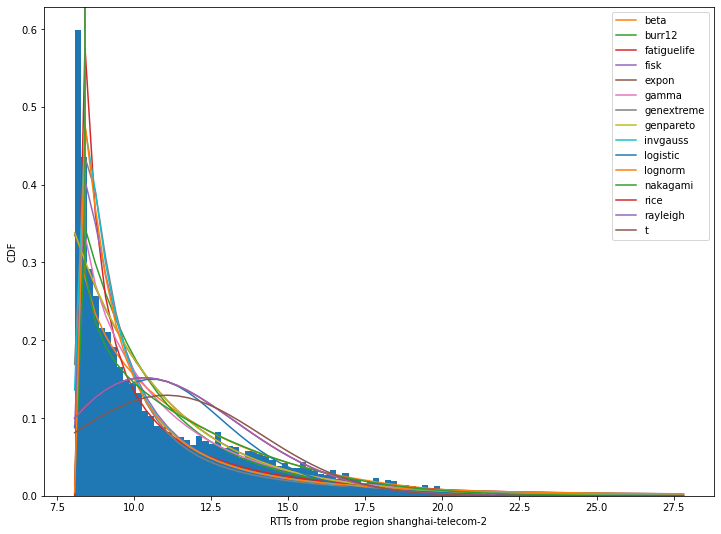

-----------region id: wuxi-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
t 0
lognorm 0
gamma 0
nakagami 0
beta 0
rice 0
genpareto 0
genextreme 0
burr12 0
fisk 0


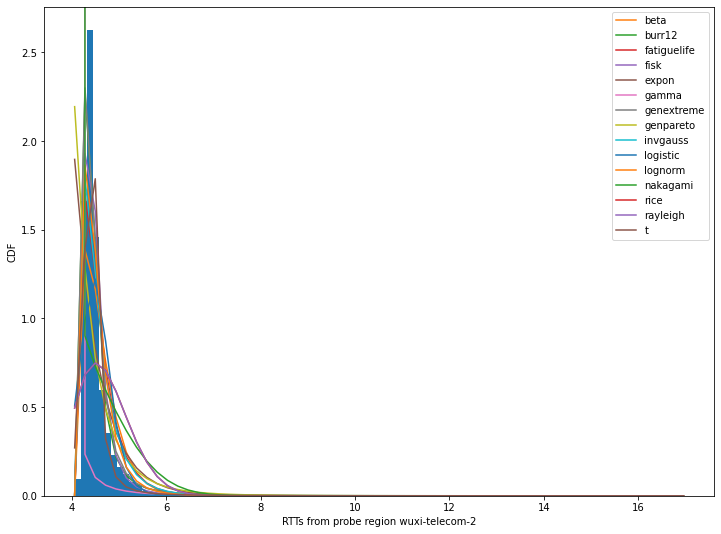

-----------region id: suzhou-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
rice 0
fatiguelife 0
t 0
genextreme 0
invgauss 0
beta 0
lognorm 0
genpareto 0
fisk 0
burr12 0


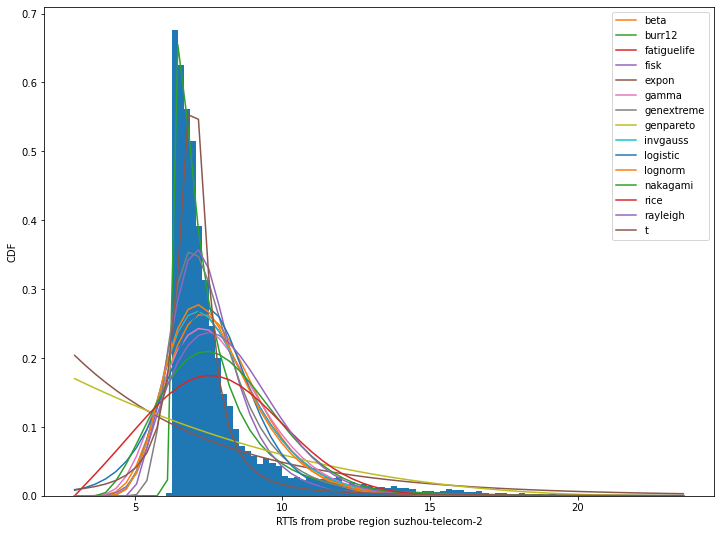

-----------region id: wuhan-telecom-3-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
nakagami 0
t 0
rice 0
beta 0
genpareto 0
burr12 1
genextreme 0
fisk 0


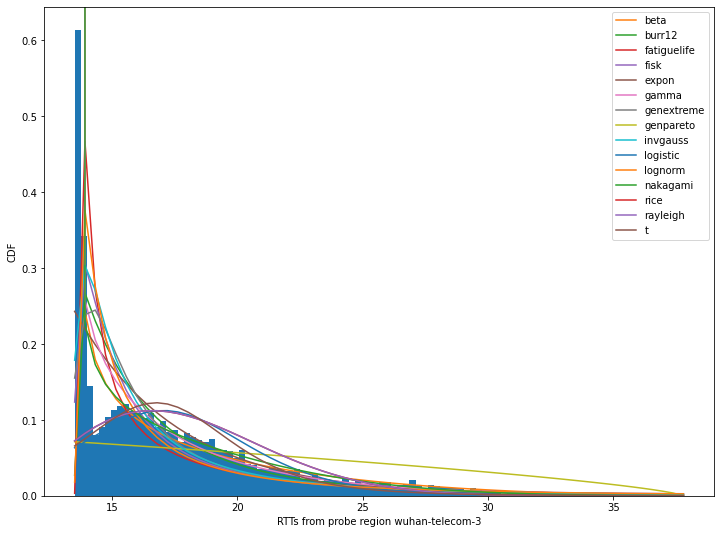

-----------region id: xiamen-telecom_unicom_cmcc-------------
True
expon 0
logistic 0
rayleigh 0
nakagami 0
gamma 0
fatiguelife 0
invgauss 0
t 0
beta 0
genextreme 0
lognorm 0
burr12 0
rice 0
genpareto 0
fisk 0


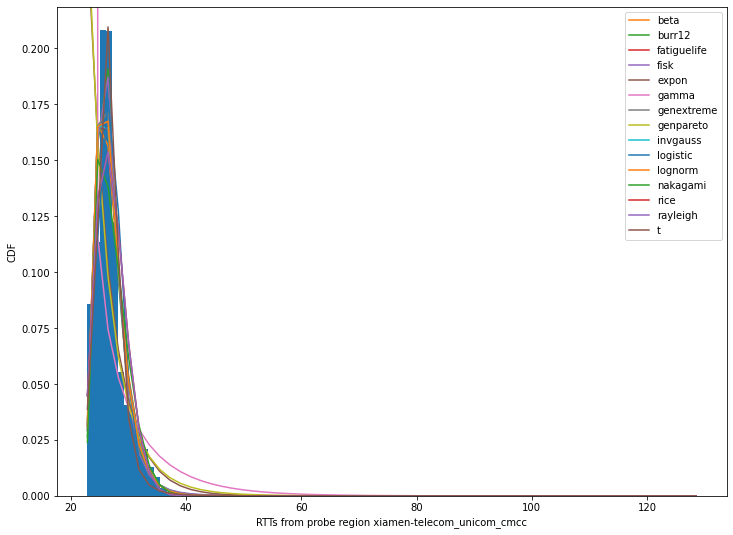

-----------region id: jinan-telecom-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
invgauss 0
gamma 0
lognorm 0
rice 0
nakagami 0
t 0
beta 0
genpareto 0
burr12 1
genextreme 0
fisk 0


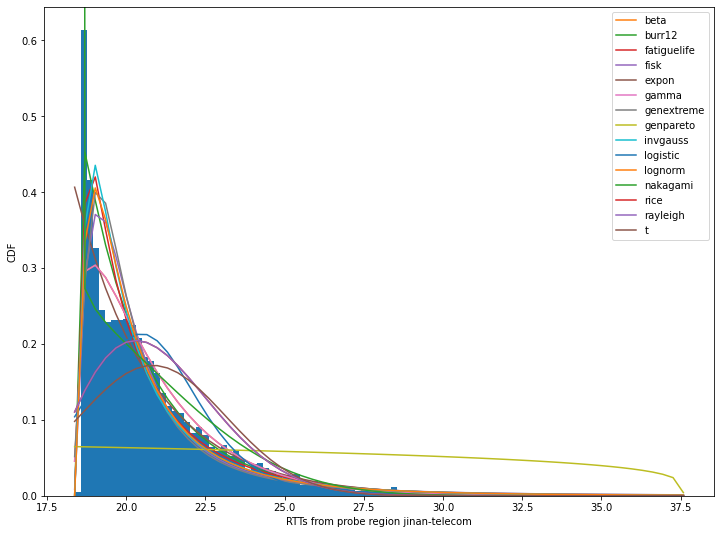

-----------region id: wuhu-telecom-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
invgauss 0
lognorm 0
t 0
gamma 0
nakagami 0
rice 0
genextreme 0
beta 0
genpareto 0
burr12 0
fisk 0


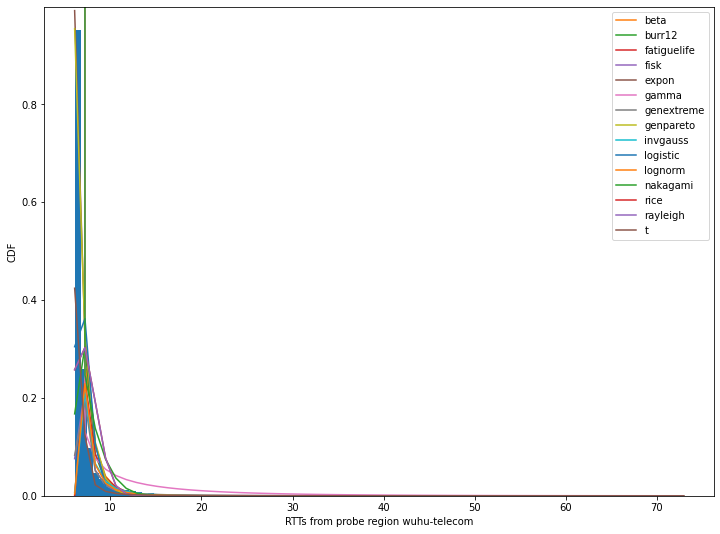

-----------region id: qingdao-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
fatiguelife 0
beta 0
t 0
rice 0
invgauss 0
lognorm 0
genextreme 0
burr12 1
genpareto 0
fisk 0


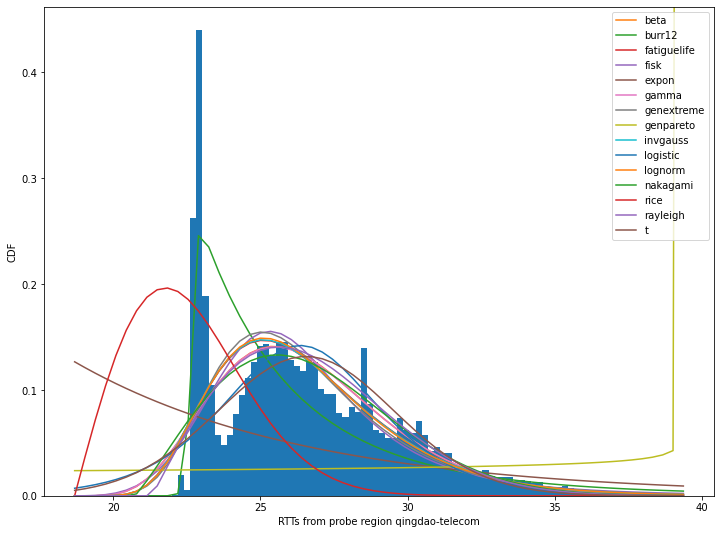

-----------region id: wenzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
fatiguelife 0
invgauss 0
nakagami 0
rice 0
t 0
genextreme 0
lognorm 0
beta 0
genpareto 0
burr12 1
fisk 0


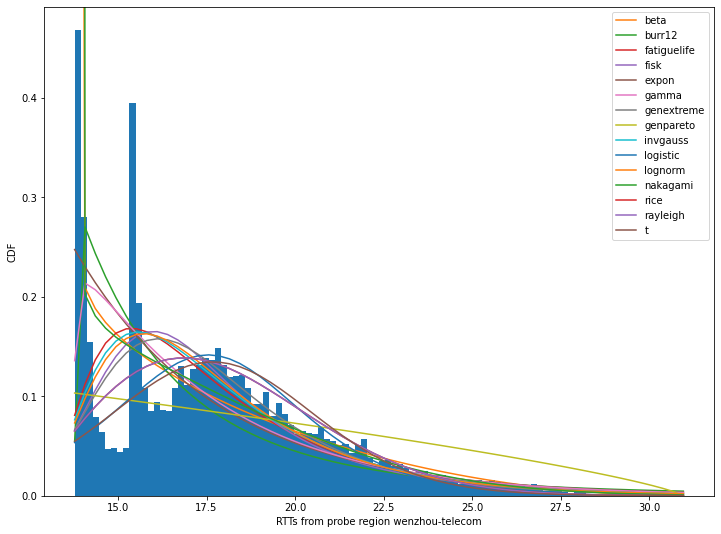

-----------region id: hangzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
invgauss 0
fatiguelife 0
t 0
beta 0
rice 0
lognorm 0
genpareto 0
burr12 0
genextreme 0
fisk 0


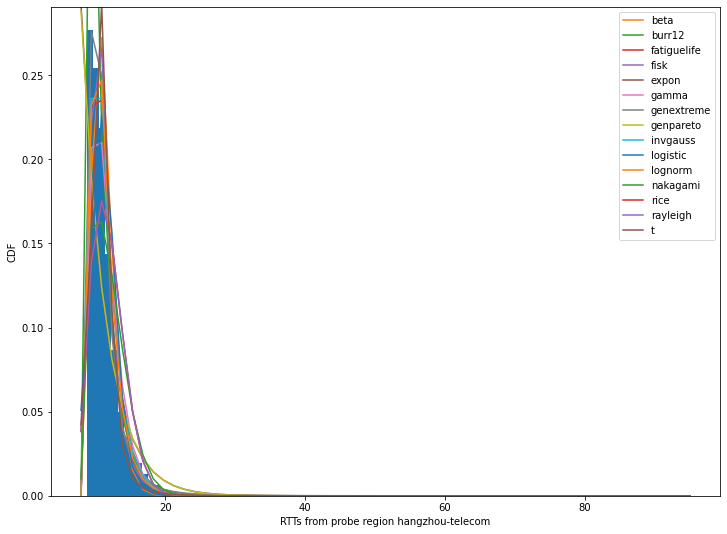

03:38:43.839758
-----------region id: shanghai-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
t 0
nakagami 0
rice 0
genextreme 0
beta 0
genpareto 0
burr12 1
fisk 0


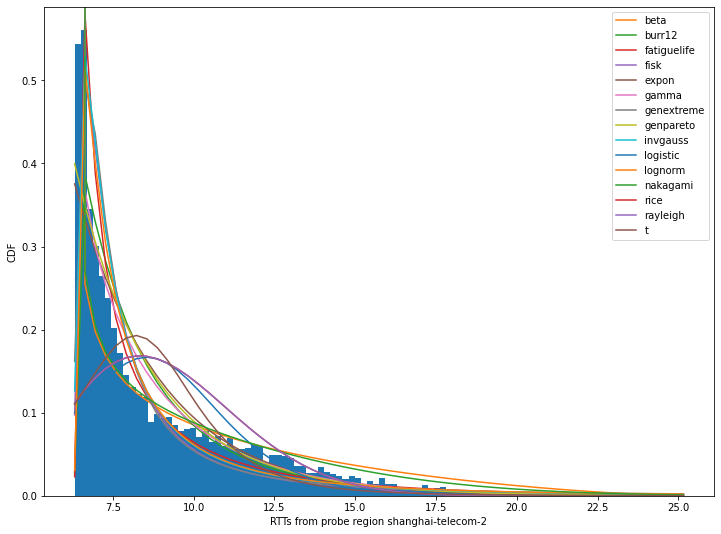

-----------region id: wuxi-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
t 0
lognorm 0
gamma 0
rice 0
nakagami 0
genextreme 0
beta 0
genpareto 0
burr12 0
fisk 0


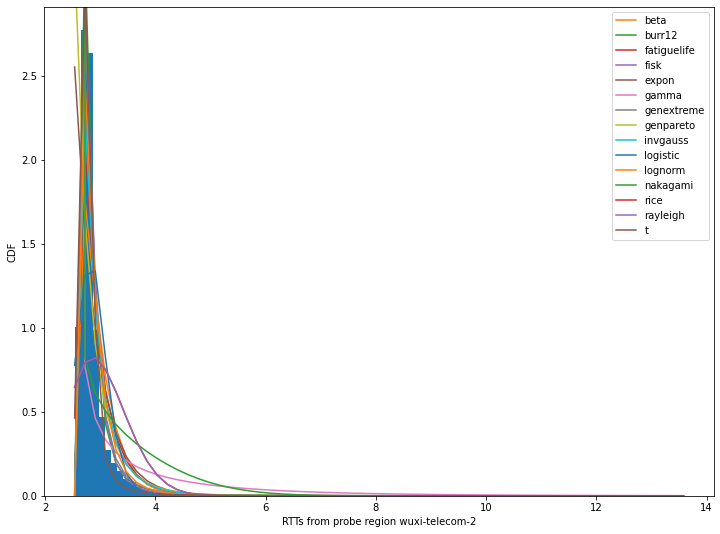

-----------region id: suzhou-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
t 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
nakagami 0
rice 0
genextreme 0
burr12 0
genpareto 0
fisk 0
beta 0


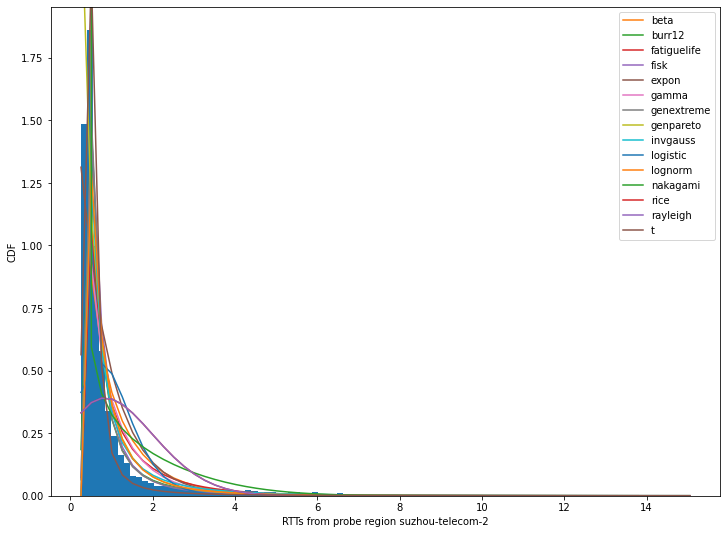

-----------region id: wuhan-telecom-3-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
beta 0
rice 0
fatiguelife 0
t 0
fisk 0
invgauss 0
lognorm 0
genpareto 0
burr12 1
genextreme 0


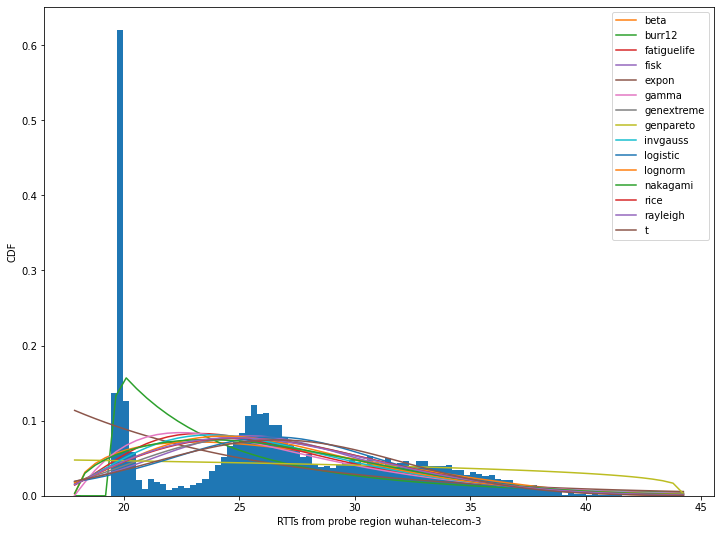

-----------region id: xiamen-telecom_unicom_cmcc-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
nakagami 0
rice 0
t 0
beta 0
genpareto 0
burr12 1
genextreme 0
fisk 0


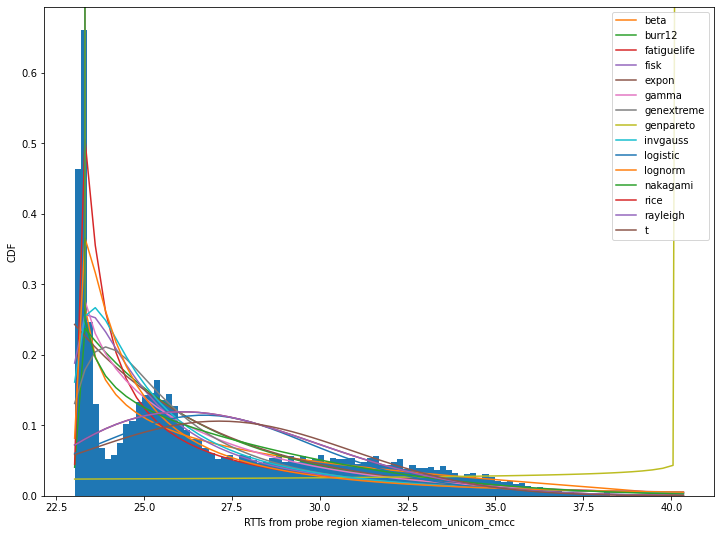

-----------region id: jinan-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
t 0
genpareto 0
beta 0
genextreme 0
invgauss 0
rice 0
fatiguelife 0
lognorm 0
burr12 0
fisk 0


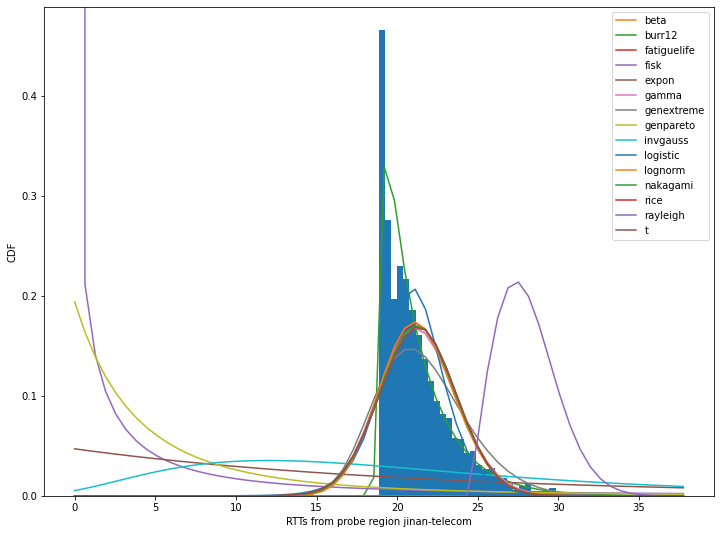

-----------region id: wuhu-telecom-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
invgauss 0
lognorm 0
t 0
gamma 0
nakagami 0
rice 0
beta 0
genextreme 0
genpareto 0
burr12 0
fisk 0


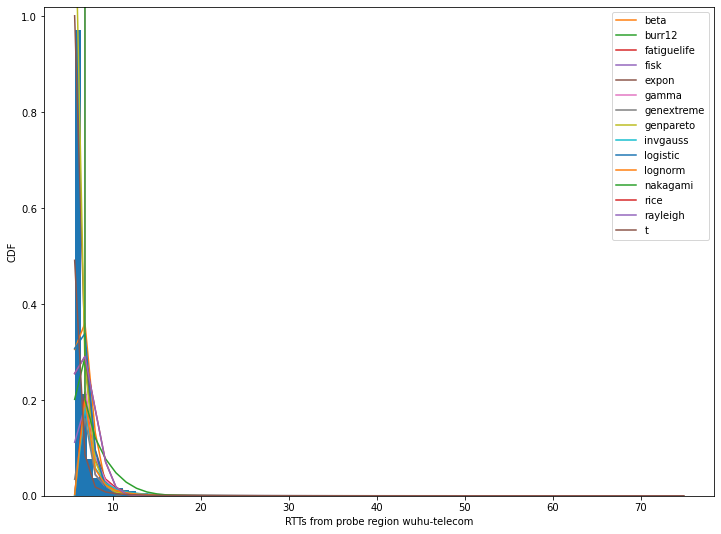

-----------region id: qingdao-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
fatiguelife 0
invgauss 0
rice 0
t 0
nakagami 0
lognorm 0
genextreme 0
beta 0
genpareto 0
burr12 1
fisk 0


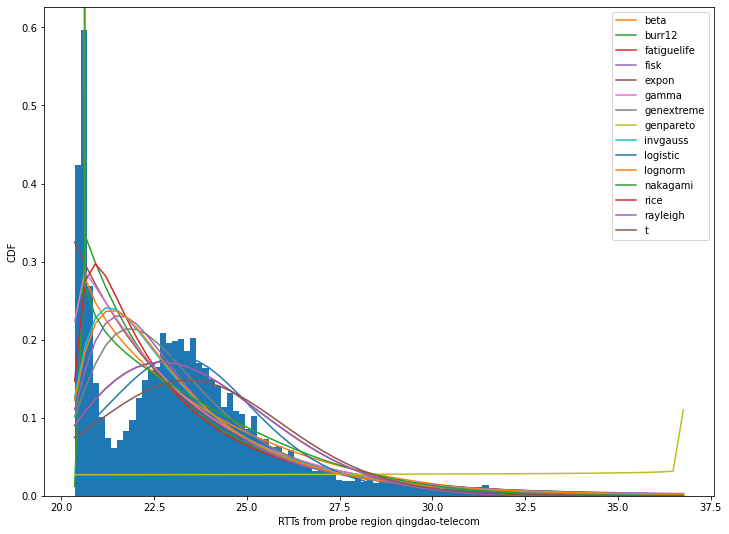

-----------region id: wenzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
fatiguelife 0
invgauss 0
t 0
rice 0
beta 0
lognorm 0
genpareto 0
genextreme 0
burr12 1
fisk 0


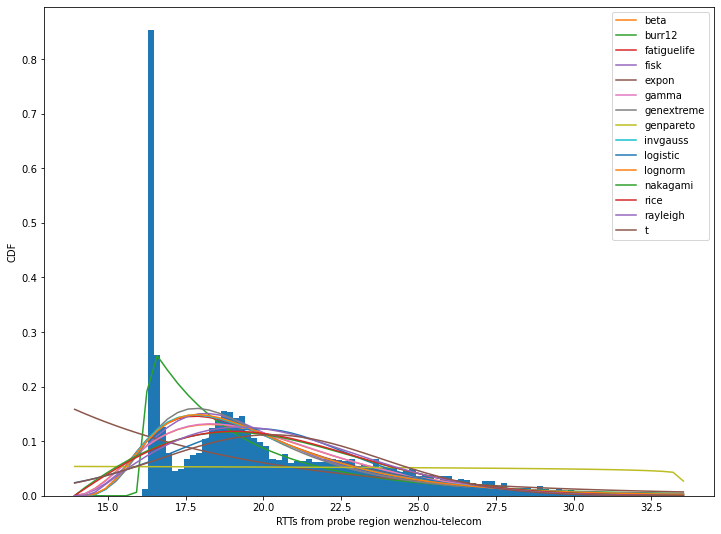

-----------region id: hangzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
fatiguelife 0
invgauss 0
rice 0
t 0
beta 0
genextreme 0
lognorm 0
genpareto 0
fisk 0
burr12 0


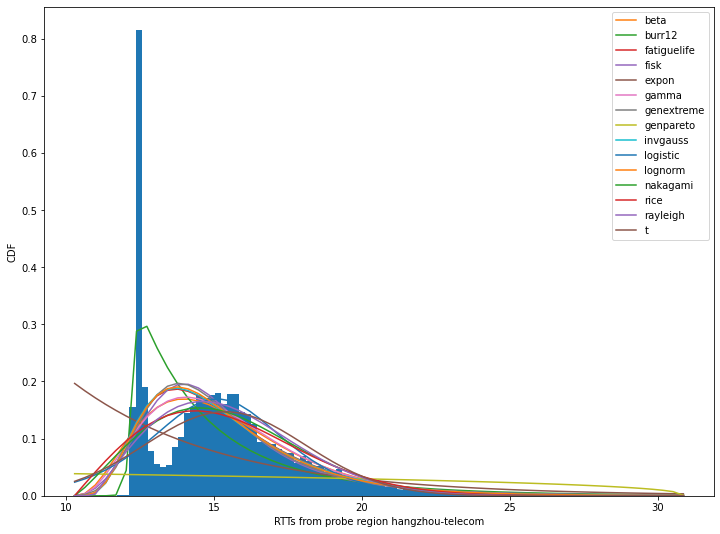

07:06:34.949301


In [27]:
# edge node 2: wuxi-telecom_unicom_cmcc
print(datetime.now().time())
best_fits_p_values_for_wuxi_telecom_unicom_cmcc = calculate_best_fits_for_region_mc('wuxi-telecom_unicom_cmcc', distributions_to_test, 1000)
# edge node 3: suzhou-telecom
print(datetime.now().time())
best_fits_p_values_for_suzhou_telecom = calculate_best_fits_for_region_mc('suzhou-telecom', distributions_to_test, 1000)
print(datetime.now().time())

In [78]:
# print out p-values for each distribution method for edge node 2: wuxi-telecom_unicom_cmcc
print("-------------wuxi_telecom_unicom_cmcc-------------")
print("\n")
for best_fit in best_fits_p_values_for_wuxi_telecom_unicom_cmcc:
    print(f"-----Traffic from probe region {best_fit[0]}-----")
    print_best_fits(best_fit[1])
    print("\n")

-------------wuxi_telecom_unicom_cmcc-------------


-----Traffic from probe region shanghai-telecom-2-----
beta: p-value = 0.002
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.062
expon: p-value = 0.0
gamma: p-value = 0.041
genextreme: p-value = 0.046
genpareto: p-value = 0.222
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.917
rice: p-value = 0.0
rayleigh: p-value = 0.004
t: p-value = 0.0


-----Traffic from probe region wuxi-telecom-2-----
beta: p-value = 0.193
burr12: p-value = 0.307
fatiguelife: p-value = 0.0
fisk: p-value = 0.001
expon: p-value = 0.0
gamma: p-value = 0.0
genextreme: p-value = 0.0
genpareto: p-value = 0.606
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.0
rice: p-value = 0.0
rayleigh: p-value = 0.005
t: p-value = 0.001


-----Traffic from probe region suzhou-telecom-2-----
beta: p-value = 0.0
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value

In [33]:
# save the result into "../datasets/split-rtt-files/cleandata/all-dist/wuxi-telecom_unicom_cmcc.pickle"
save_fit_results("wuxi-telecom_unicom_cmcc", best_fits_p_values_for_wuxi_telecom_unicom_cmcc)

In [79]:
# print out p-values for each distribution method for edge node 3: suzhou-telecom
print("-------------suzhou_telecom-------------")
print("\n")
for best_fit in best_fits_p_values_for_suzhou_telecom:
    print(f"-----Traffic from probe region {best_fit[0]}-----")
    print_best_fits(best_fit[1])
    print("\n")

-------------suzhou_telecom-------------


-----Traffic from probe region shanghai-telecom-2-----
beta: p-value = 0.002
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.049
expon: p-value = 0.0
gamma: p-value = 0.008
genextreme: p-value = 0.0
genpareto: p-value = 0.281
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.578
rice: p-value = 0.0
rayleigh: p-value = 0.013
t: p-value = 0.0


-----Traffic from probe region wuxi-telecom-2-----
beta: p-value = 0.001
burr12: p-value = 0.009
fatiguelife: p-value = 0.0
fisk: p-value = 0.001
expon: p-value = 0.0
gamma: p-value = 0.003
genextreme: p-value = 0.0
genpareto: p-value = 0.445
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.0
rice: p-value = 0.0
rayleigh: p-value = 0.003
t: p-value = 0.001


-----Traffic from probe region suzhou-telecom-2-----
beta: p-value = 0.0
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.0
exp

In [34]:
# save the result into "../datasets/split-rtt-files/cleandata/all-dist/suzhou-telecom.pickle"
save_fit_results("suzhou-telecom", best_fits_p_values_for_suzhou_telecom)

11:17:06.340933
-----------region id: shanghai-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
gamma 0
lognorm 0
rice 0
t 0
nakagami 0
beta 0
genpareto 0
genextreme 0
burr12 1
fisk 0


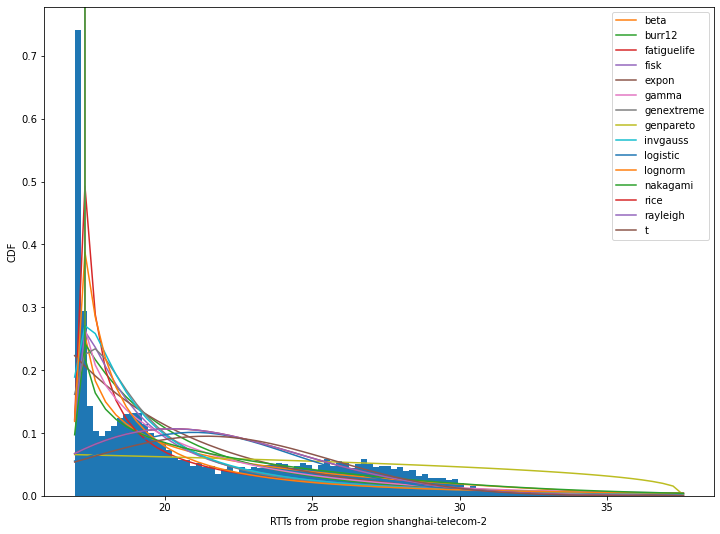

-----------region id: wuxi-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
invgauss 0
gamma 0
lognorm 0
t 0
nakagami 0
rice 0
beta 0
genextreme 0
genpareto 0
burr12 1
fisk 0


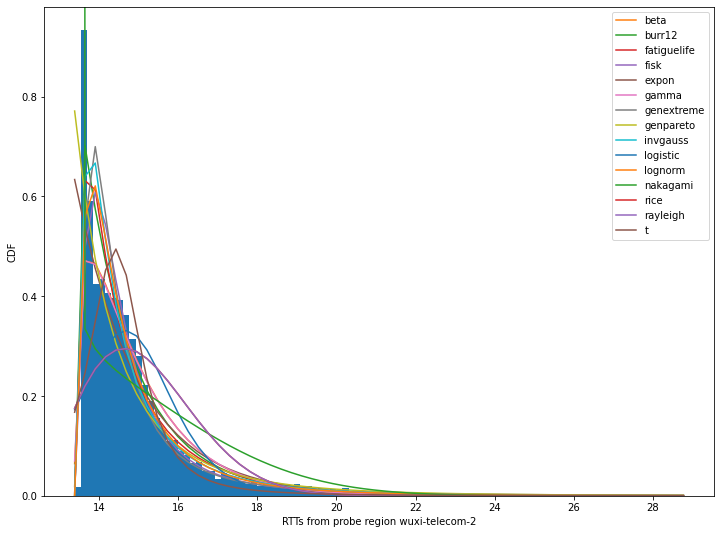

-----------region id: suzhou-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
nakagami 0
rice 0
t 0
beta 0
genpareto 0
burr12 1
genextreme 0
fisk 0


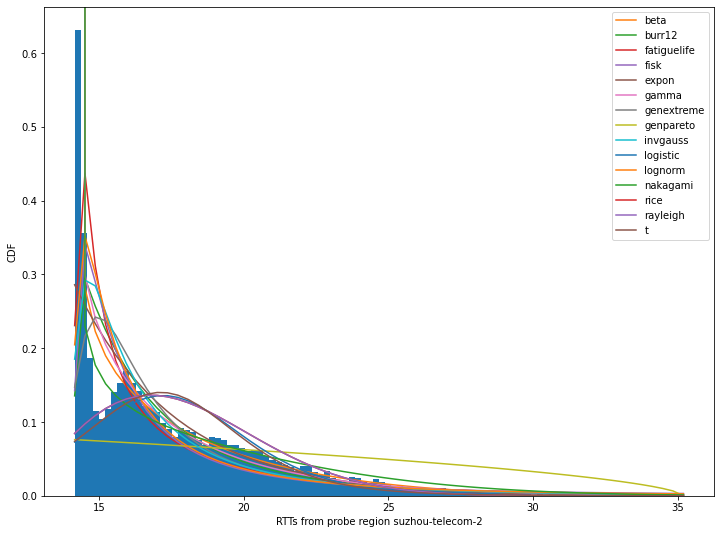

-----------region id: wuhan-telecom-3-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
lognorm 0
invgauss 0
t 0
gamma 0
nakagami 0
rice 0
genpareto 0
genextreme 0
beta 0
burr12 0
fisk 0


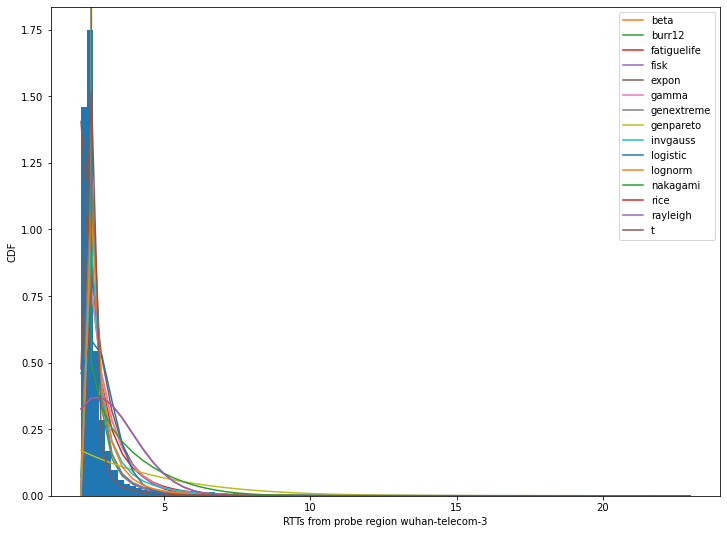

-----------region id: xiamen-telecom_unicom_cmcc-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
fisk 0
nakagami 0
t 0
rice 0
genextreme 0
beta 0
burr12 1
genpareto 0


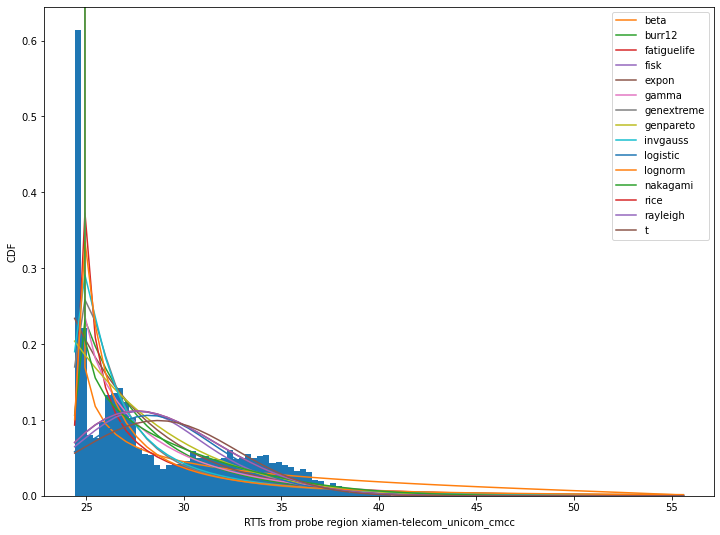

-----------region id: jinan-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
t 0
burr12 0
fisk 0
beta 0
rice 0
invgauss 0
fatiguelife 0
lognorm 0
genextreme 0
genpareto 0


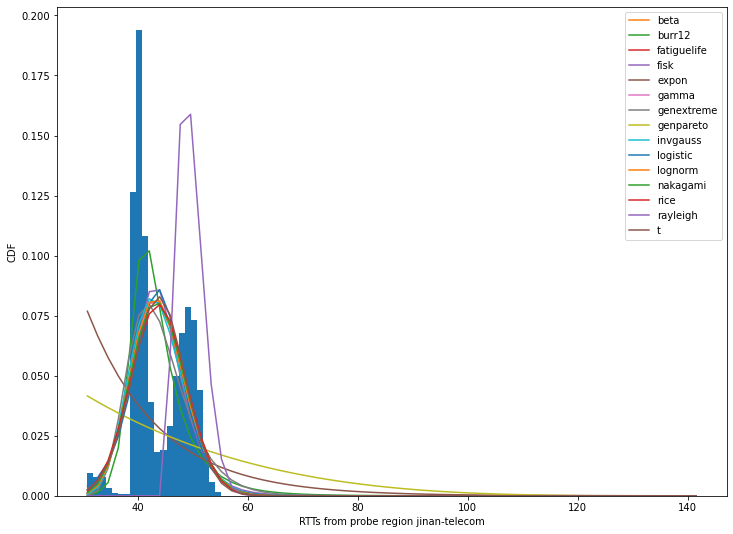

-----------region id: wuhu-telecom-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
t 0
nakagami 0
rice 0
genpareto 0
beta 0
burr12 1
genextreme 0
fisk 0


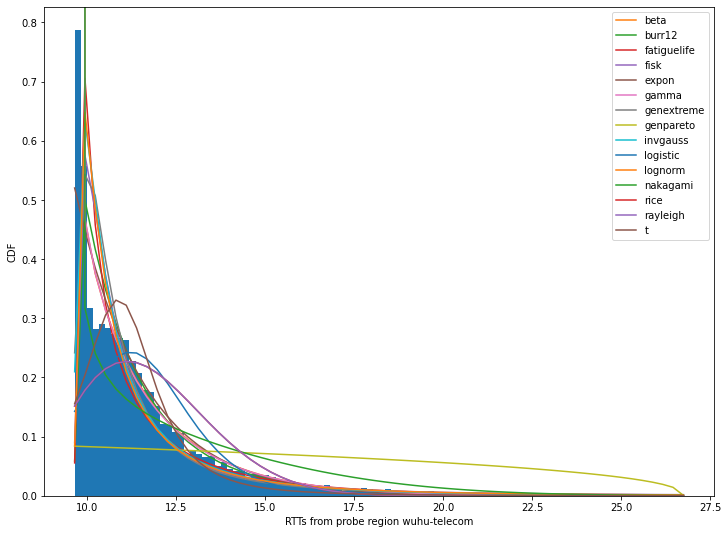

-----------region id: qingdao-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
beta 0
t 0
nakagami 0
rice 0
invgauss 0
burr12 0
fatiguelife 0
fisk 0
genpareto 0
lognorm 0
genextreme 0


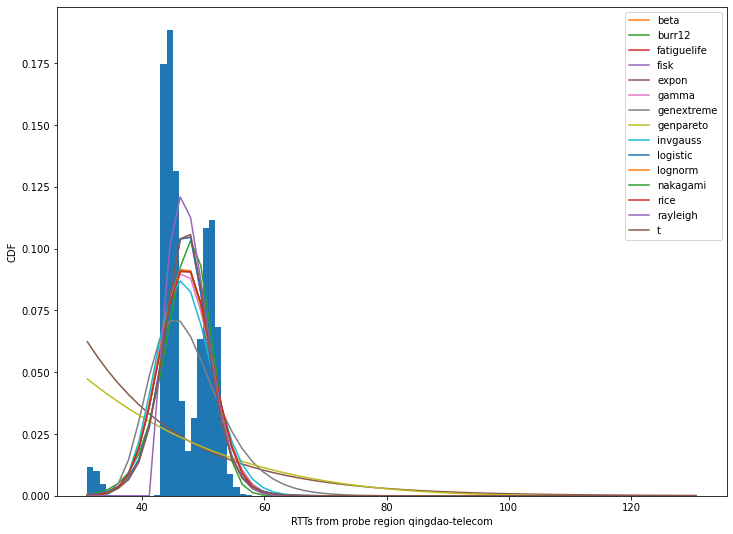

-----------region id: wenzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
fatiguelife 0
invgauss 0
t 0
rice 0
lognorm 0
beta 0
genpareto 0
genextreme 0
burr12 1
fisk 0


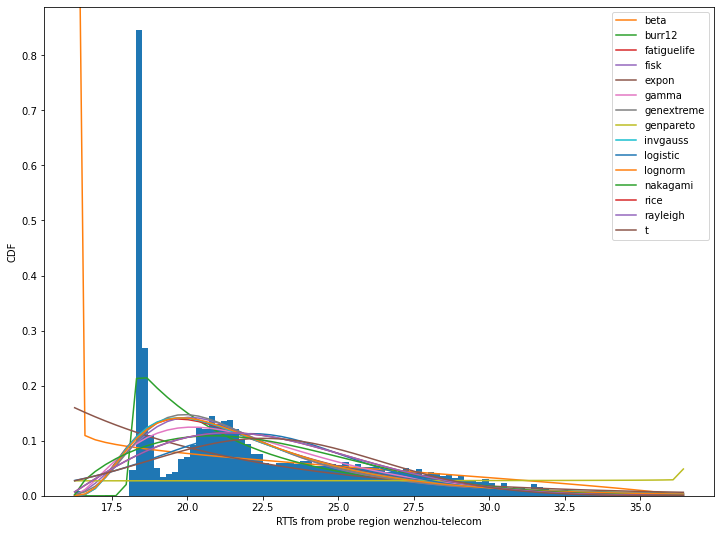

-----------region id: hangzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
fatiguelife 0
invgauss 0
gamma 0
nakagami 0
rice 0
t 0
lognorm 0
genextreme 0
beta 0
burr12 1
genpareto 0
fisk 0


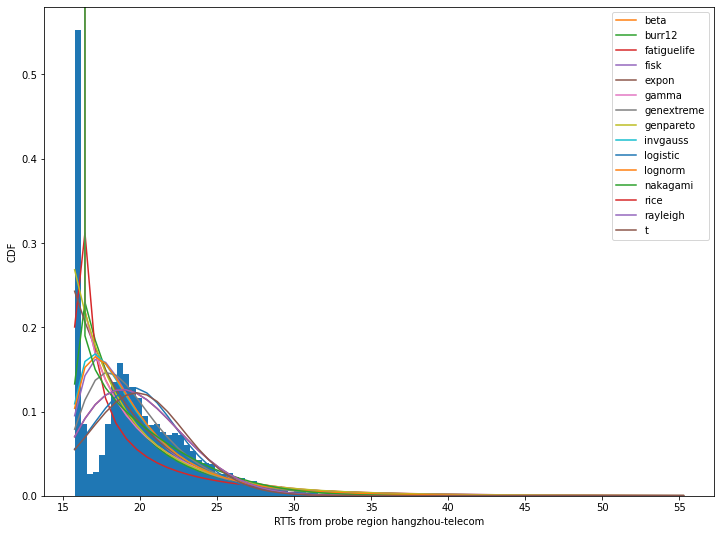

14:55:36.274967
-----------region id: shanghai-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
gamma 0
lognorm 0
rice 0
t 0
nakagami 0
beta 0
genextreme 0
genpareto 0
burr12 1
fisk 0


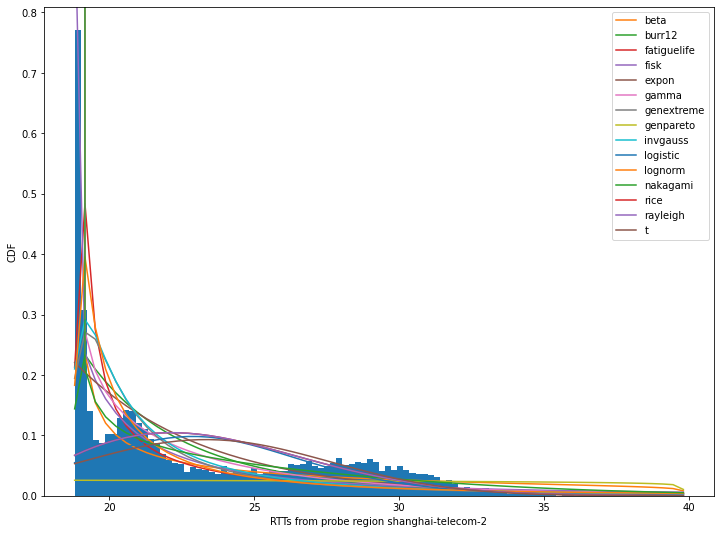

-----------region id: wuxi-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
beta 0
rice 0
fatiguelife 0
t 0
burr12 0
invgauss 0
lognorm 0
genextreme 0
genpareto 0
fisk 0


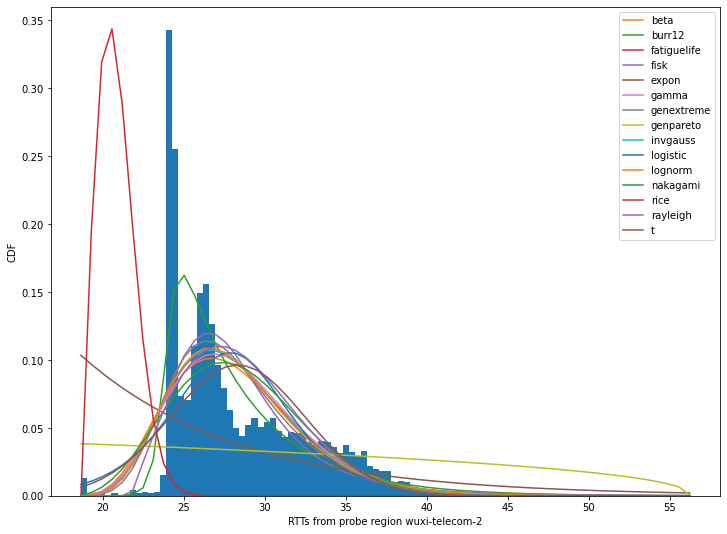

-----------region id: suzhou-telecom-2-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
gamma 0
lognorm 0
nakagami 0
genpareto 0
rice 0
t 0
fisk 0
genextreme 0
beta 0
burr12 1


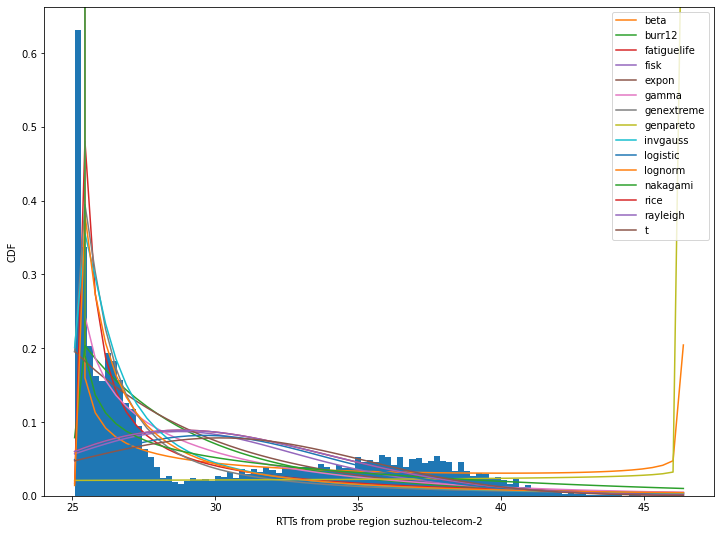

-----------region id: wuhan-telecom-3-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
rice 0
fatiguelife 0
fisk 0
t 0
invgauss 0
genpareto 0
lognorm 0
beta 0
burr12 1
genextreme 0


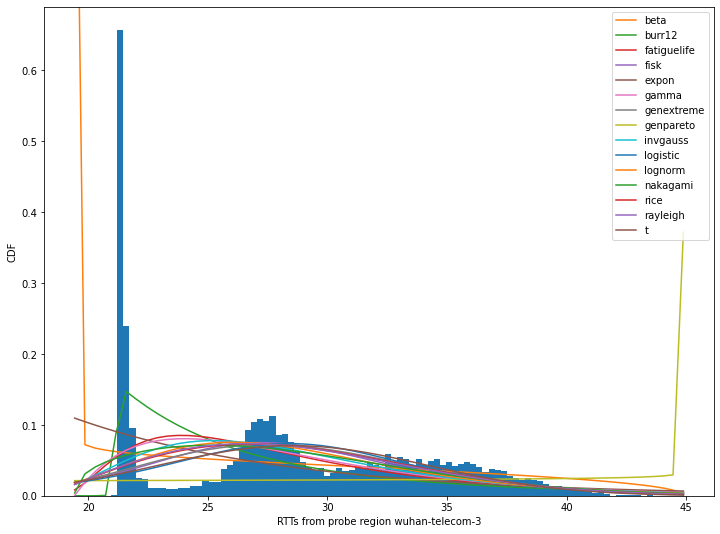

-----------region id: xiamen-telecom_unicom_cmcc-------------
True
expon 0
logistic 0
rayleigh 0
t 0
fatiguelife 0
invgauss 0
gamma 0
lognorm 0
nakagami 0
rice 0
genextreme 0
beta 0
fisk 0
genpareto 0
burr12 0


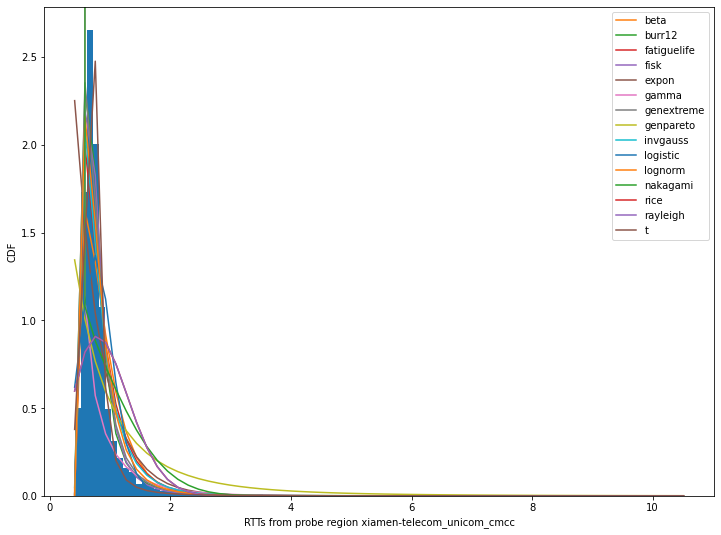

-----------region id: jinan-telecom-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
gamma 0
fatiguelife 0
nakagami 0
t 0
rice 0
lognorm 0
beta 0
genpareto 0
genextreme 0
burr12 1
fisk 0


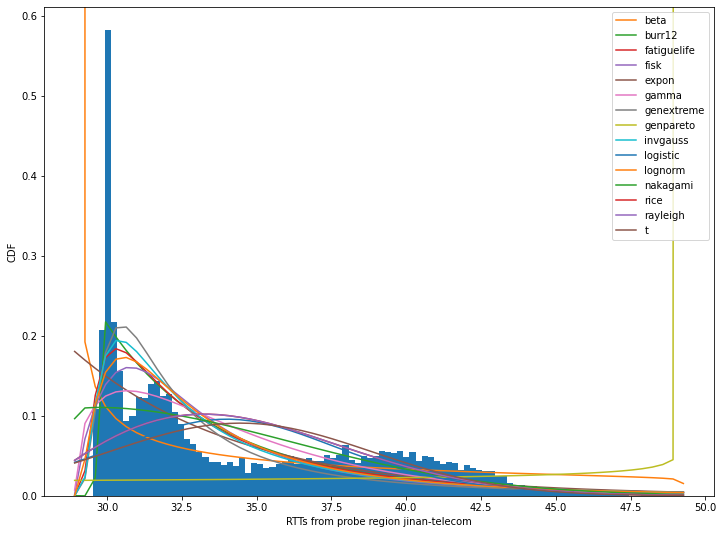

-----------region id: wuhu-telecom-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
gamma 0
lognorm 0
beta 0
nakagami 0
t 0
rice 0
burr12 1
genextreme 0
genpareto 0
fisk 0


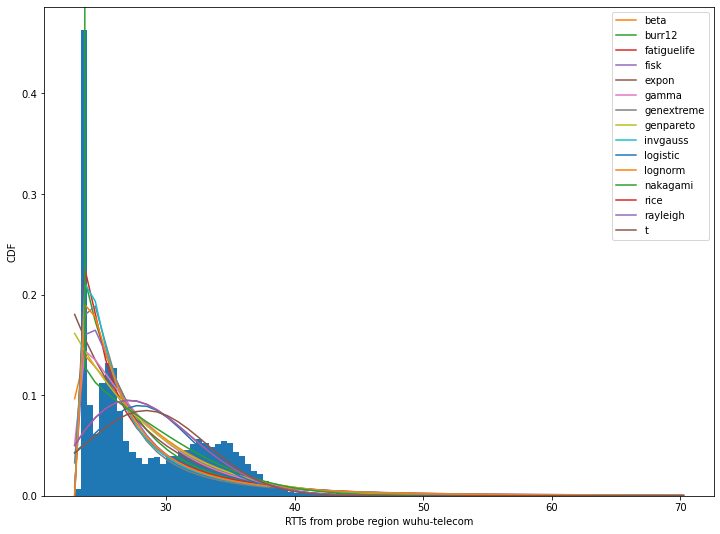

-----------region id: qingdao-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
beta 0
t 0
fatiguelife 0
rice 0
invgauss 0
lognorm 0
genpareto 0
burr12 0
genextreme 0
fisk 0


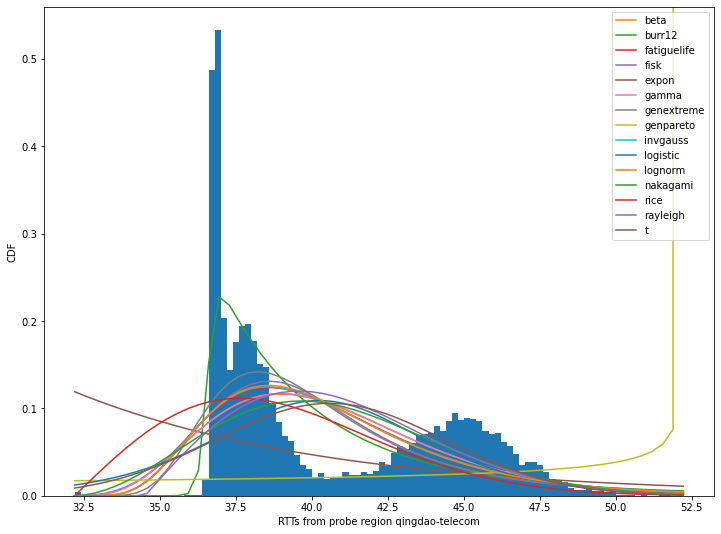

-----------region id: wenzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
gamma 0
nakagami 0
t 0
rice 0
genextreme 0
genpareto 0
beta 0
fatiguelife 0
invgauss 0
lognorm 0
burr12 0
fisk 0


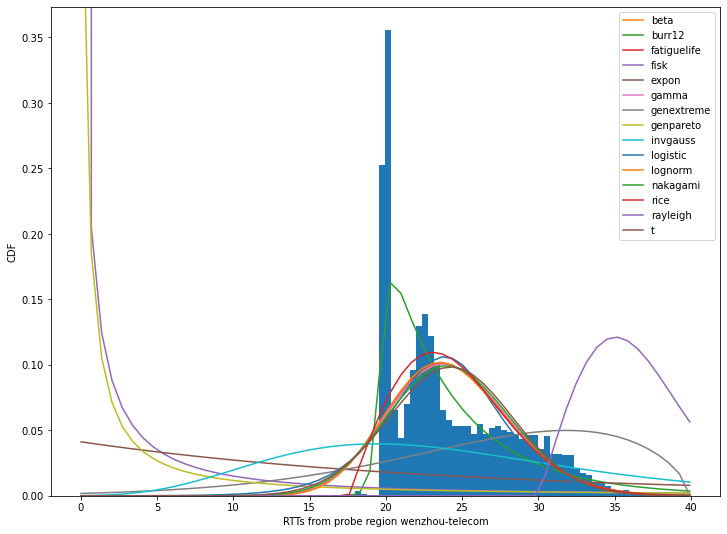

-----------region id: hangzhou-telecom-------------
True
expon 0
logistic 0
rayleigh 0
invgauss 0
fatiguelife 0
lognorm 0
gamma 0
nakagami 0
rice 0
t 0
beta 0
burr12 1
genpareto 0
genextreme 0
fisk 0


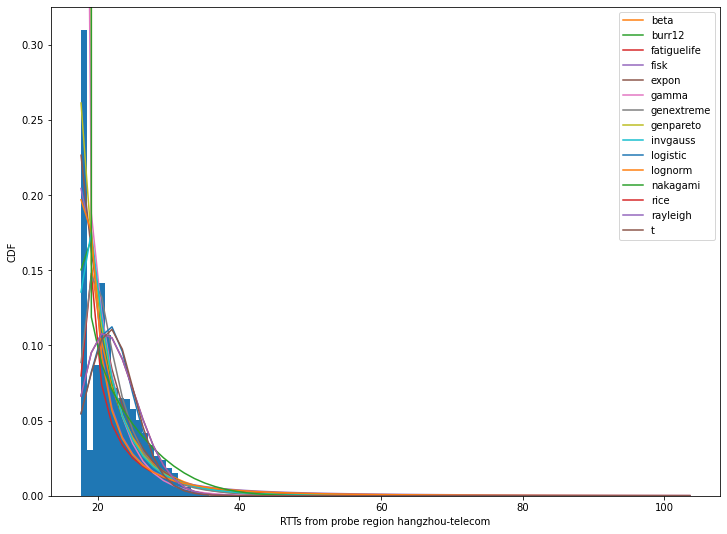

18:28:02.729468


In [28]:
# edge node 4: wuhan-telecom
print(datetime.now().time())
best_fits_p_values_for_wuhan_telecom = calculate_best_fits_for_region_mc('wuhan-telecom', distributions_to_test, 1000)
# edge node 5: xiamen-telecom
print(datetime.now().time())
best_fits_p_values_for_xiamen_telecom = calculate_best_fits_for_region_mc('xiamen-telecom', distributions_to_test, 1000)
print(datetime.now().time())

In [35]:
# save the result into "../datasets/split-rtt-files/cleandata/all-dist/wuhan-telecom.pickle"
save_fit_results("wuhan-telecom", best_fits_p_values_for_wuhan_telecom)
# save the result into "../datasets/split-rtt-files/cleandata/all-dist/xiamen-telecom.pickle"
save_fit_results("xiamen-telecom", best_fits_p_values_for_xiamen_telecom)

In [80]:
# print out p-values for each distribution method for edge node 4: wuhan-telecom
print("-------------wuhan_telecom-------------")
print("\n")
for best_fit in best_fits_p_values_for_wuhan_telecom:
    print(f"-----Traffic from probe region {best_fit[0]}-----")
    print_best_fits(best_fit[1])
    print("\n")

-------------wuhan_telecom-------------


-----Traffic from probe region shanghai-telecom-2-----
beta: p-value = 0.143
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.121
expon: p-value = 0.0
gamma: p-value = 0.193
genextreme: p-value = 0.016
genpareto: p-value = 1.0
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.295
rice: p-value = 0.0
rayleigh: p-value = 0.006
t: p-value = 0.0


-----Traffic from probe region wuxi-telecom-2-----
beta: p-value = 0.017
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.013
expon: p-value = 0.0
gamma: p-value = 0.068
genextreme: p-value = 0.053
genpareto: p-value = 0.146
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.015
nakagami: p-value = 0.0
rice: p-value = 0.0
rayleigh: p-value = 0.007
t: p-value = 0.02


-----Traffic from probe region suzhou-telecom-2-----
beta: p-value = 0.031
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.109

In [81]:
# print out p-values for each distribution method for edge node 5: xiamen-telecom
print("-------------xiamen_telecom-------------")
print("\n")
for best_fit in best_fits_p_values_for_xiamen_telecom:
    print(f"-----Traffic from probe region {best_fit[0]}-----")
    print_best_fits(best_fit[1])
    print("\n")

-------------xiamen_telecom-------------


-----Traffic from probe region shanghai-telecom-2-----
beta: p-value = 0.0
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.129
expon: p-value = 0.0
gamma: p-value = 0.228
genextreme: p-value = 0.088
genpareto: p-value = 0.477
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.0
nakagami: p-value = 0.261
rice: p-value = 0.0
rayleigh: p-value = 0.004
t: p-value = 0.0


-----Traffic from probe region wuxi-telecom-2-----
beta: p-value = 0.0
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.0
expon: p-value = 0.0
gamma: p-value = 0.0
genextreme: p-value = 0.0
genpareto: p-value = 0.0
invgauss: p-value = 0.0
logistic: p-value = 0.0
lognorm: p-value = 0.008
nakagami: p-value = 0.0
rice: p-value = 0.0
rayleigh: p-value = 0.014
t: p-value = 0.0


-----Traffic from probe region suzhou-telecom-2-----
beta: p-value = 0.0
burr12: p-value = 0.0
fatiguelife: p-value = 0.0
fisk: p-value = 0.0
expon: p-valu

In [64]:
# H_0: The data follow a specified distribution 
# Significance level: 0.05 
# Best fits p_value > 0.05

# This function is used to select the best distribution methods (p-value > 0.05) for each edge node, 
# and save the result in "best_fits".

def select_best_fits_wthin_each_probe_region(anchor_region_id, anchor_region_results, print_p_values=False):
    best_fits = {}

    for probe_index, probe_region_id in enumerate(region_ids):
        if print_p_values:
            print(f"---------------Region pair {anchor_region_id} - {probe_region_id}---------------")
        results_per_distribution = anchor_region_results[probe_index][1]
        best_fits[probe_region_id] = []
        for distribution in distributions_to_test:
            p_value = results_per_distribution[distribution][0][1]
            if p_value > 0.05:
                best_fits[probe_region_id].append(distribution)
                if print_p_values:
                    print(f"{distribution}: {p_value}")
    print(best_fits)
    return best_fits

In [69]:
# entry function for selecting the best distribution methods

def select_best_fits(anchor_region_id, fitting_data, print_fit_results=False):
    best_fits = select_best_fits_wthin_each_probe_region(anchor_region_id, fitting_data, print_fit_results)
    return best_fits

In [70]:
# entry point for the 5 edge nodes, and print out the result
best_fits_p_values_dict = {
    'shanghai-telecom': best_fits_p_values_for_shanghai_telecom,
    'wuxi-telecom_unicom_cmcc': best_fits_p_values_for_wuxi_telecom_unicom_cmcc,
    'suzhou-telecom': best_fits_p_values_for_suzhou_telecom,
    'wuhan-telecom': best_fits_p_values_for_wuhan_telecom,
    'xiamen-telecom': best_fits_p_values_for_xiamen_telecom
}
for dc_id in dc_ids:
    anchor_region_fitting_data = best_fits_p_values_dict[dc_id]
    set_of_best_fits = select_best_fits(dc_id, anchor_region_fitting_data, True)
    print(f"Common best fits across all probes in region {dc_id}:")
    print(set_of_best_fits)
    print("\n")

---------------Region pair shanghai-telecom - shanghai-telecom-2---------------
beta: 0.063
---------------Region pair shanghai-telecom - wuxi-telecom-2---------------
genpareto: 0.721
---------------Region pair shanghai-telecom - suzhou-telecom-2---------------
gamma: 0.074
genextreme: 0.24
nakagami: 0.229
---------------Region pair shanghai-telecom - wuhan-telecom-3---------------
gamma: 0.111
nakagami: 0.61
---------------Region pair shanghai-telecom - xiamen-telecom_unicom_cmcc---------------
fisk: 0.066
gamma: 0.194
genextreme: 0.153
nakagami: 0.767
---------------Region pair shanghai-telecom - jinan-telecom---------------
genextreme: 0.213
lognorm: 0.055
---------------Region pair shanghai-telecom - wuhu-telecom---------------
burr12: 0.991
genextreme: 0.296
genpareto: 0.545
---------------Region pair shanghai-telecom - qingdao-telecom---------------
gamma: 0.193
genextreme: 0.078
---------------Region pair shanghai-telecom - wenzhou-telecom---------------
fisk: 0.15
gamma: 0.131

In [71]:
# For one edge node, it calculated the total number of occurrences of each distribution method 
# within the 10 pairs of this edge node and 10 different regions

def select_distributions_with_most_occurrences(best_fits):
    most_occurring_distributions = {}
    for region_id in region_ids:
        distributions_of_the_region_pair = best_fits[region_id]
        for distribution in distributions_of_the_region_pair:
            if most_occurring_distributions.get(distribution):
                most_occurring_distributions[distribution] += 1
            else:
                most_occurring_distributions[distribution] = 1
    
    return sorted(most_occurring_distributions.items(), key=lambda x:x[1], reverse=True)

In [74]:
# entry point of calculating the total number of occurrences of each distribution method for each edge node
distributions_with_most_occurrences_all_regions = []
for dc_id in dc_ids:
    anchor_region_fitting_data = best_fits_p_values_dict[dc_id]
    best_fits = select_best_fits(dc_id, anchor_region_fitting_data, False)
    distributions_with_most_occurrences = select_distributions_with_most_occurrences(best_fits)
    distributions_with_most_occurrences_all_regions.append(distributions_with_most_occurrences)
    print(f"-------------------REGION {dc_id}-------------------")
    print(distributions_with_most_occurrences)
    print("\n")

{'shanghai-telecom-2': ['beta'], 'wuxi-telecom-2': ['genpareto'], 'suzhou-telecom-2': ['gamma', 'genextreme', 'nakagami'], 'wuhan-telecom-3': ['gamma', 'nakagami'], 'xiamen-telecom_unicom_cmcc': ['fisk', 'gamma', 'genextreme', 'nakagami'], 'jinan-telecom': ['genextreme', 'lognorm'], 'wuhu-telecom': ['burr12', 'genextreme', 'genpareto'], 'qingdao-telecom': ['gamma', 'genextreme'], 'wenzhou-telecom': ['fisk', 'gamma', 'genpareto', 'nakagami'], 'hangzhou-telecom': ['fisk', 'gamma', 'genextreme', 'genpareto']}
-------------------REGION shanghai-telecom-------------------
[('gamma', 6), ('genextreme', 6), ('genpareto', 4), ('nakagami', 4), ('fisk', 3), ('beta', 1), ('lognorm', 1), ('burr12', 1)]


{'shanghai-telecom-2': ['fisk', 'genpareto', 'nakagami'], 'wuxi-telecom-2': ['beta', 'burr12', 'genpareto'], 'suzhou-telecom-2': [], 'wuhan-telecom-3': ['beta', 'fisk', 'gamma', 'nakagami'], 'xiamen-telecom_unicom_cmcc': ['beta', 'fisk', 'gamma', 'genpareto', 't'], 'jinan-telecom': ['gamma', 'gene

In [75]:
# This function is used to calculate the top 5 distribution methods with most occurrences across the 5 edge nodes.

def select_distributions_with_most_occurrences_across_regions(distributions_with_most_occurrences_all_regions):
    common = set(x[0] for x in distributions_with_most_occurrences_all_regions[0][:5])
    for region in distributions_with_most_occurrences_all_regions[1:]:
        common = common & set(x[0] for x in region[:5])
    print(common)

In [76]:
select_distributions_with_most_occurrences_across_regions(distributions_with_most_occurrences_all_regions)

{'fisk', 'genpareto', 'nakagami', 'gamma'}


In [13]:
selected_distributions = ['fisk', 'genpareto', 'nakagami', 'gamma']

In [11]:
# This function is used to extract the parameters of the best fits for each pair of regions and edge nodes.

def get_distribution_parameters_from_fit(dist_name, results_per_region_pair):
    dist_results = results_per_region_pair[dist_name]
    ks_statistic = dist_results[0][0]
    p_value = dist_results[0][1]
    arg = dist_results[1]['arg']
    loc = dist_results[1]['loc']
    scale = dist_results[1]['scale']
    
    return ks_statistic, p_value, arg, loc, scale

In [12]:
# This function is used to generate rtt values according to the best fit for each pair of regions and edge nodes.
# If "maximum_rtt_across_all_links" is enabled,
# the values cannot exceed the maximum value across all the links in the training data.

def select_random_sample_w_upper_bound(dist, random_sample_size, maximum_rtt_across_all_links = None):
    random_sample = []
    i = 0
    while i < random_sample_size:
        random_value = dist.rvs()
        if maximum_rtt_across_all_links != None:
            if random_value <= maximum_rtt_across_all_links:
                random_sample.append(random_value)
                i += 1
        else:
            random_sample.append(random_value)
            i += 1
    return random_sample

In [13]:
# This function is used to find the maximum rtt value across all the links in the training data.

def find_max_RTT_across_all_links():
    maximum_rtt_across_all_links = float('-inf')
    for dc_id in dc_ids:
        for region_index, region_id in enumerate(region_ids):
            probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
            max_value = np.max(probe_region_rtt_values)
            if max_value > maximum_rtt_across_all_links:
                maximum_rtt_across_all_links = max_value
    return maximum_rtt_across_all_links

In [14]:
# This function is used to find the maximum rtt value on a specific pair of regions and edge nodes.

def find_max_RTT_in_each_pair(region_id, dc_id):
    maximum_rtt_in_each_pair = float('-inf')
    probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
    max_value = np.max(probe_region_rtt_values)
    if max_value > maximum_rtt_across_all_links:
        maximum_rtt_in_each_pair = max_value
    return maximum_rtt_in_each_pair

In [78]:
# This function is used to plot CDF and PDF for both rtt values from training data and generated data for each edge node,
# through which we can compare the accuracy of each model.

def plot_actual_rtts_w_sample(anchor_region_id, probe_region_id, results_per_region_pair, probe_region_rtt_values, random_sample_size, dist_name, ax, i, j, sample_upper_bound=None):
    # (1) Plot actual RTTs with PDF
    y = probe_region_rtt_values
    x = np.linspace(start=min(y), stop=max(y), num=len(y))
    ax[i][j].hist(y, 100, density=True, color='c')
    bottom, top = ax[i][j].get_ylim()
    dist = getattr(scipy.stats, dist_name)
    ks_statistic, p_value, arg, loc, scale = get_distribution_parameters_from_fit(dist_name, results_per_region_pair)

    # Fix distribution parameters
    dist = dist(*arg, loc=loc, scale=scale)

    dist_pdf = dist.pdf(x)
    ax[i][j].plot(x, dist_pdf)
    ax[i][j].set_ylim(bottom, top)
    ax[i][j].set_xlabel(f'PDF Actual RTTs with {dist_name} fit {anchor_region_id}-{probe_region_id}')

    # (3) Plot eCDF of actual RTTs into rightmost plot
    e = ECDF(y)
    ax[i][j+2].plot(e.x, e.y, label="actual")

    # (2) Plot sample RTTs with PDF
    y = select_random_sample_w_upper_bound(dist, random_sample_size, sample_upper_bound)
    x = np.linspace(start=min(y), stop=max(y), num=random_sample_size)
    ax[i][j+1].hist(y, 100, density=True)
    bottom, top = ax[i][j+1].get_ylim()
    dist_pdf = dist.pdf(x)
    ax[i][j+1].plot(x, dist_pdf)
    ax[i][j+1].set_xlabel(f"PDF Sample RTTs with {dist_name} fit {anchor_region_id}-{probe_region_id}")
    ax[i][j+1].set_ylim(bottom, top)
    
    # (3) Add eCDF of sample RTTs into rightmost plot
    e = ECDF(y)
    ax[i][j+2].plot(e.x, e.y, label="sample")
    ax[i][j+2].set_xlabel(f'CDF Actual RTTs with sample RTTs {anchor_region_id}-{probe_region_id}')
    ax[i][j+2].legend()
    

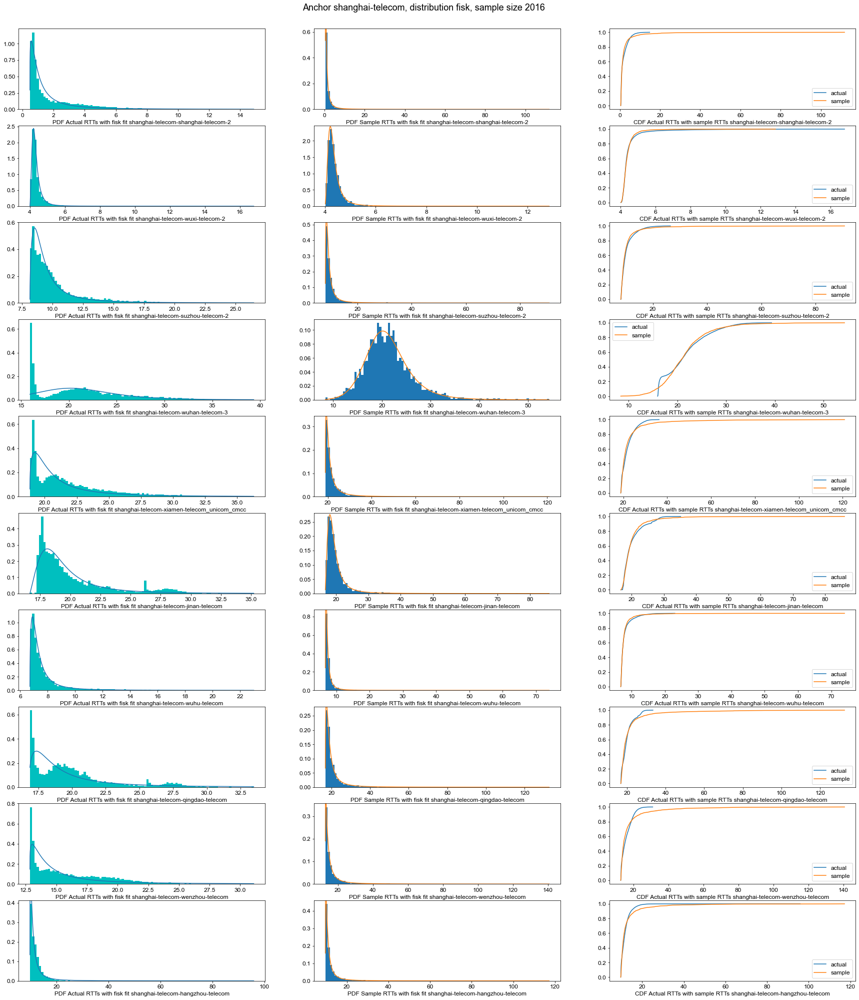

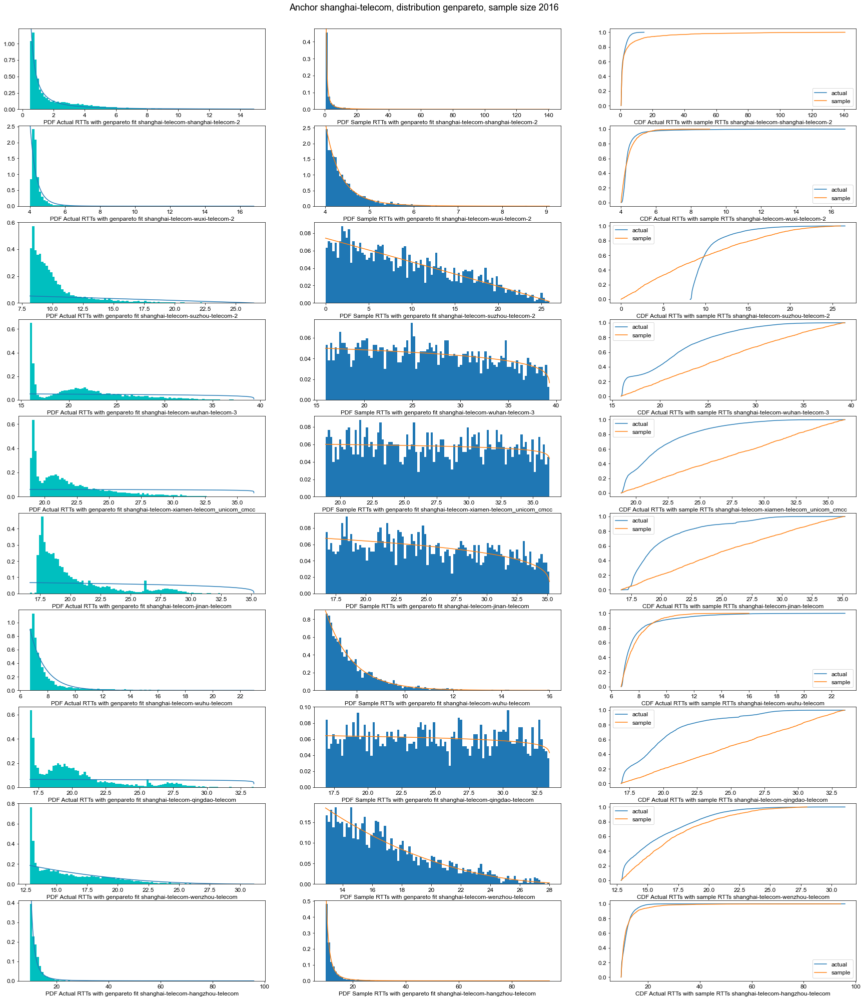

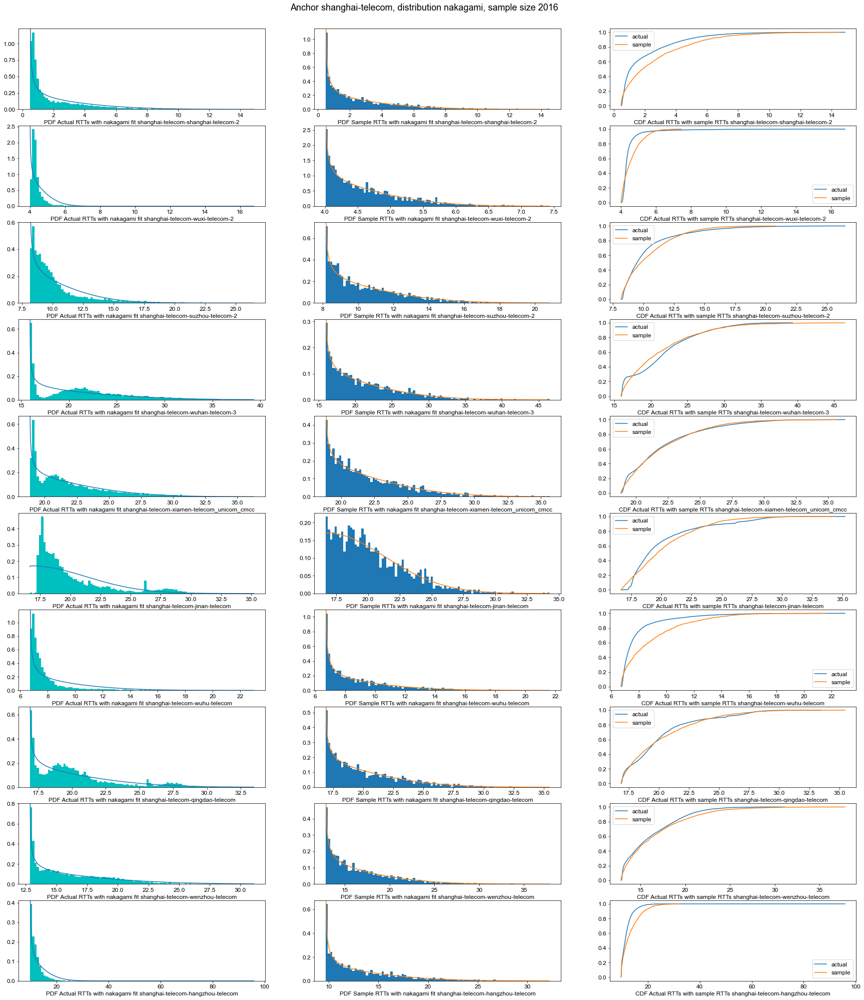

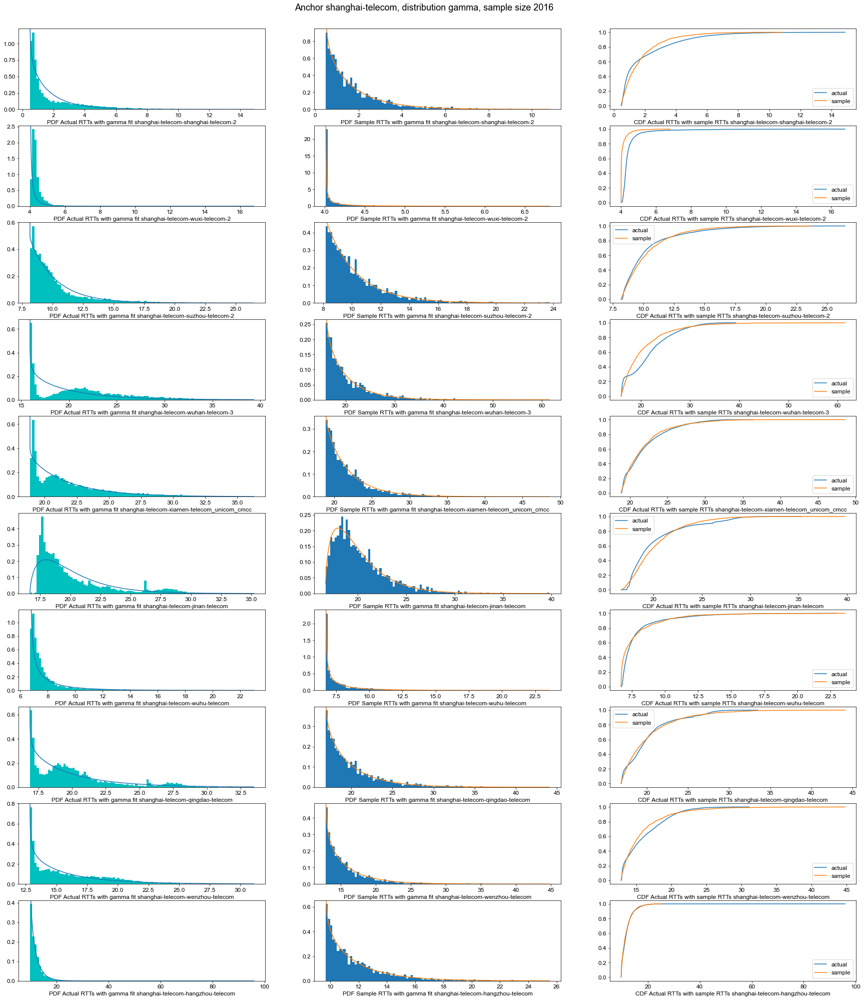

In [79]:
# edge node 1: shanghai-telecom
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "shanghai-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

for dist in dist_name:
    fig, ax = plt.subplots(10, 3, figsize=(30, 35))
    fig.suptitle(f"Anchor {dc_id}, distribution {dist}, sample size {sample_size}", fontsize=18, y=0.9)
    i = 0
    for region_index, region_id in enumerate(region_ids):
        probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
        results_per_region_pair = region_fitting_results[region_index][1]
        plot_actual_rtts_w_sample(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist, ax, i, 0, maximum_RTT)
        i += 1
    # save the plot
    plt.savefig(f"../datasets/split-rtt-files/cleandata/all-dist/0531_0607_{dist}_{dc_id}")

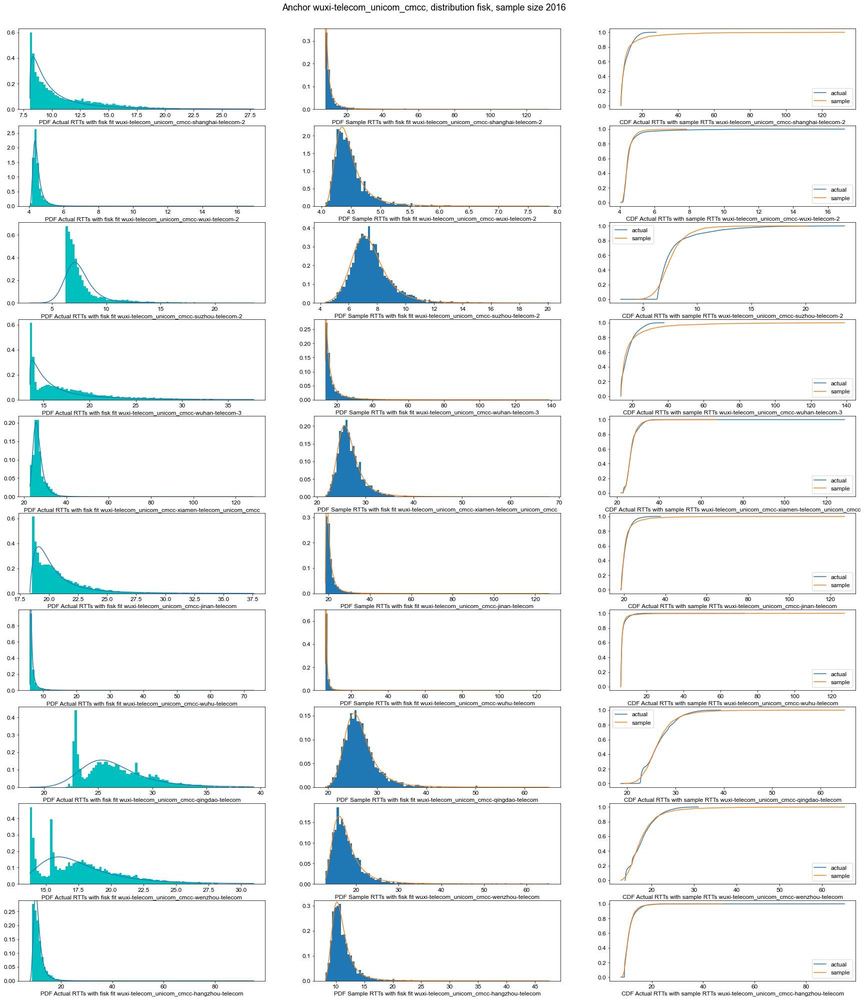

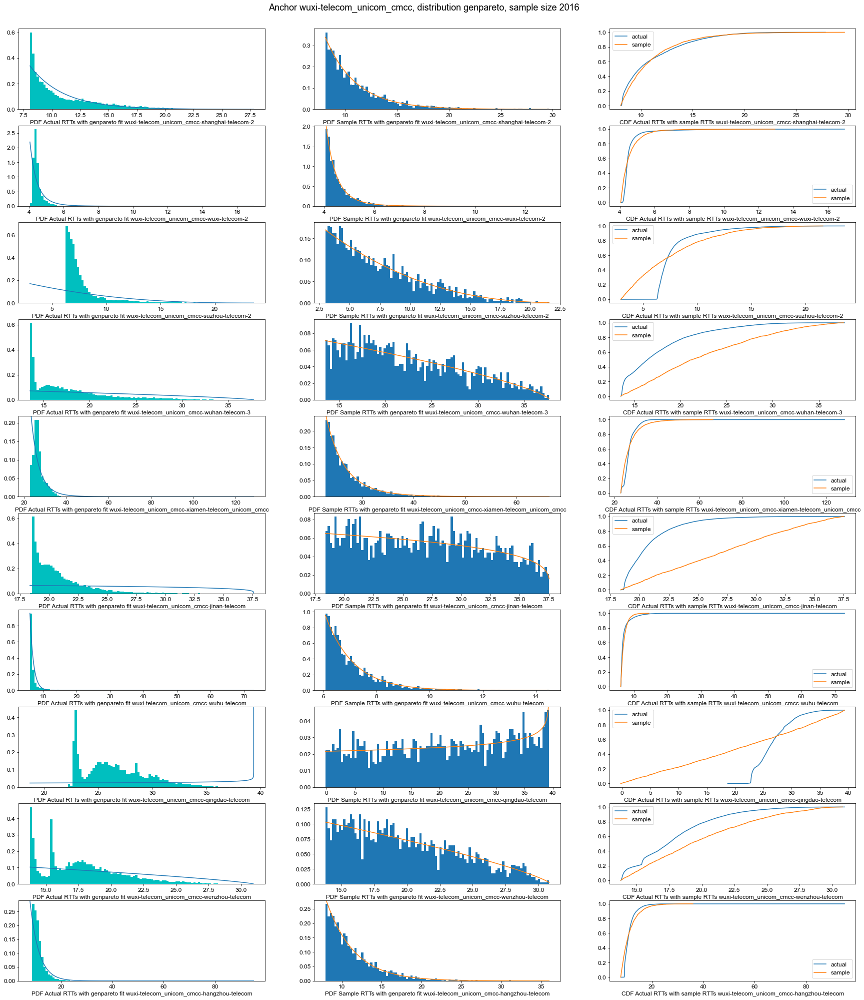

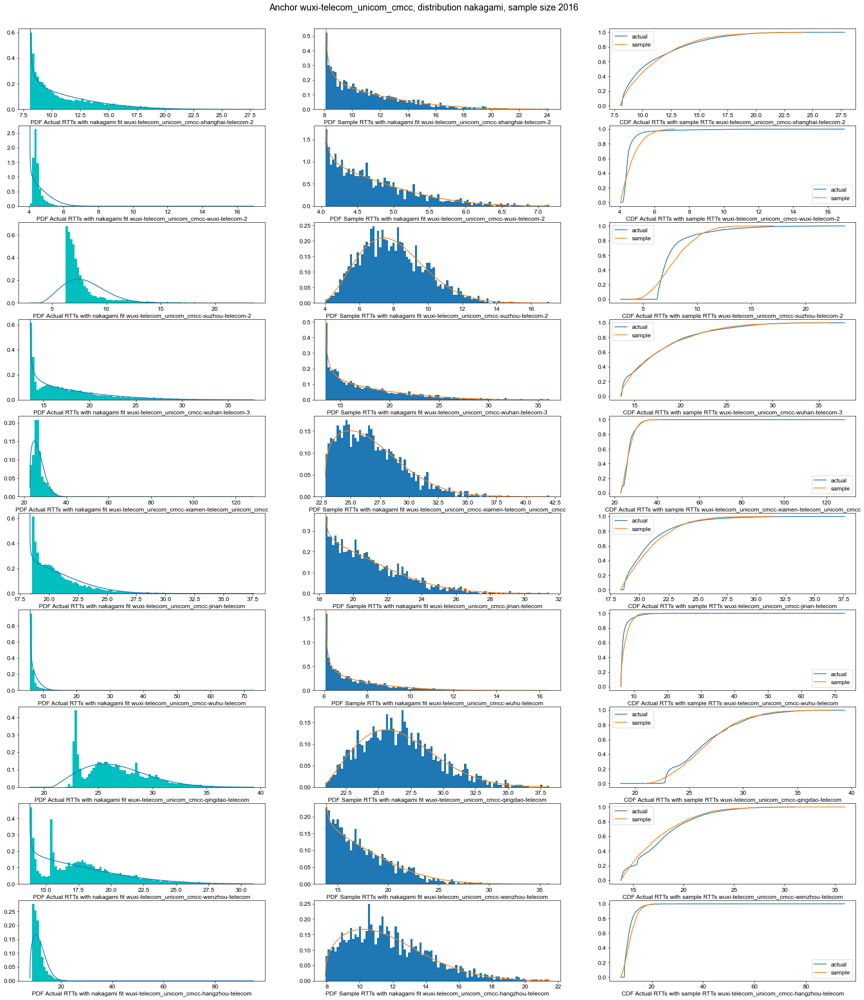

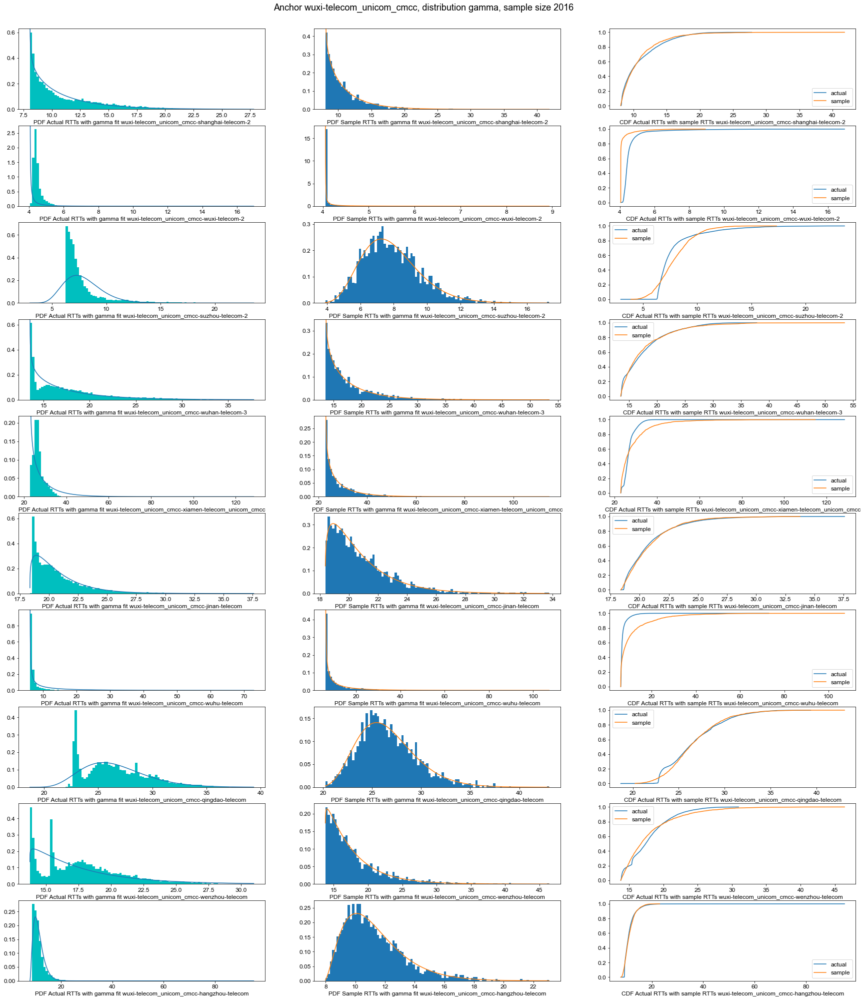

In [80]:
# edge node 2: wuxi-telecom_unicom_cmcc
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "wuxi-telecom_unicom_cmcc"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

for dist in dist_name:
    fig, ax = plt.subplots(10, 3, figsize=(30, 35))
    fig.suptitle(f"Anchor {dc_id}, distribution {dist}, sample size {sample_size}", fontsize=18, y=0.9)
    i = 0
    for region_index, region_id in enumerate(region_ids):
        probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
        results_per_region_pair = region_fitting_results[region_index][1]
        plot_actual_rtts_w_sample(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist, ax, i, 0, maximum_RTT)
        i += 1
    # save the plot
    plt.savefig(f"../datasets/split-rtt-files/cleandata/all-dist/0531_0607_{dist}_{dc_id}")

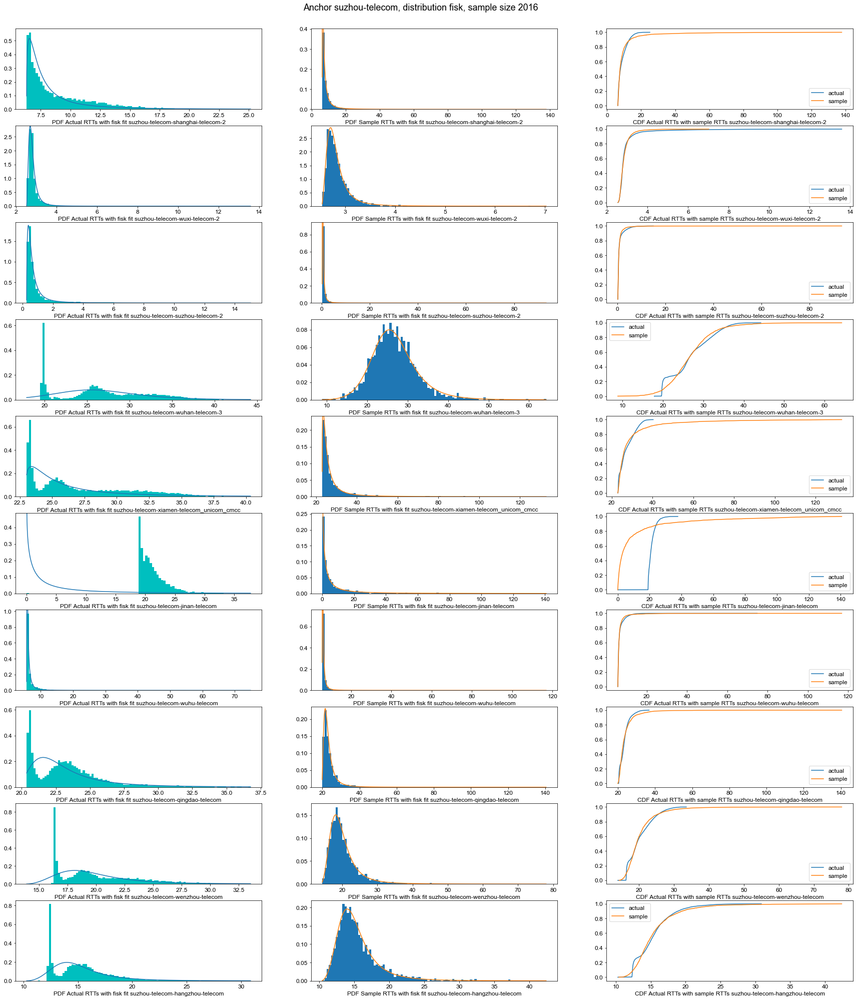

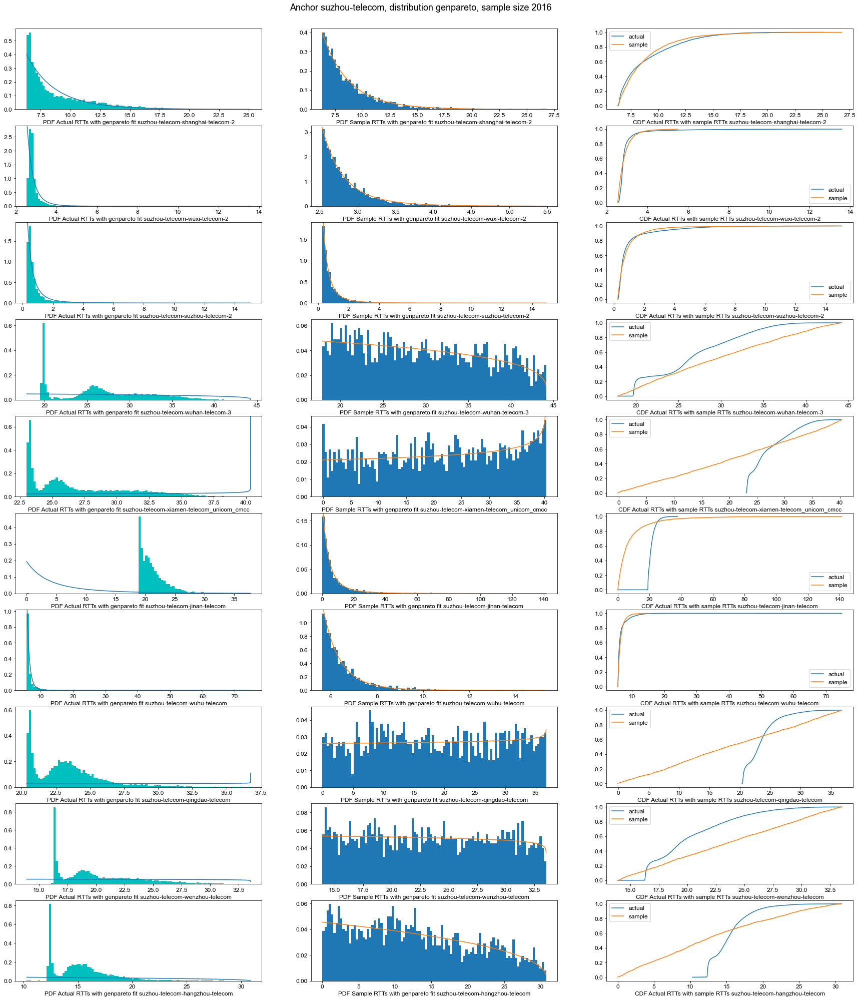

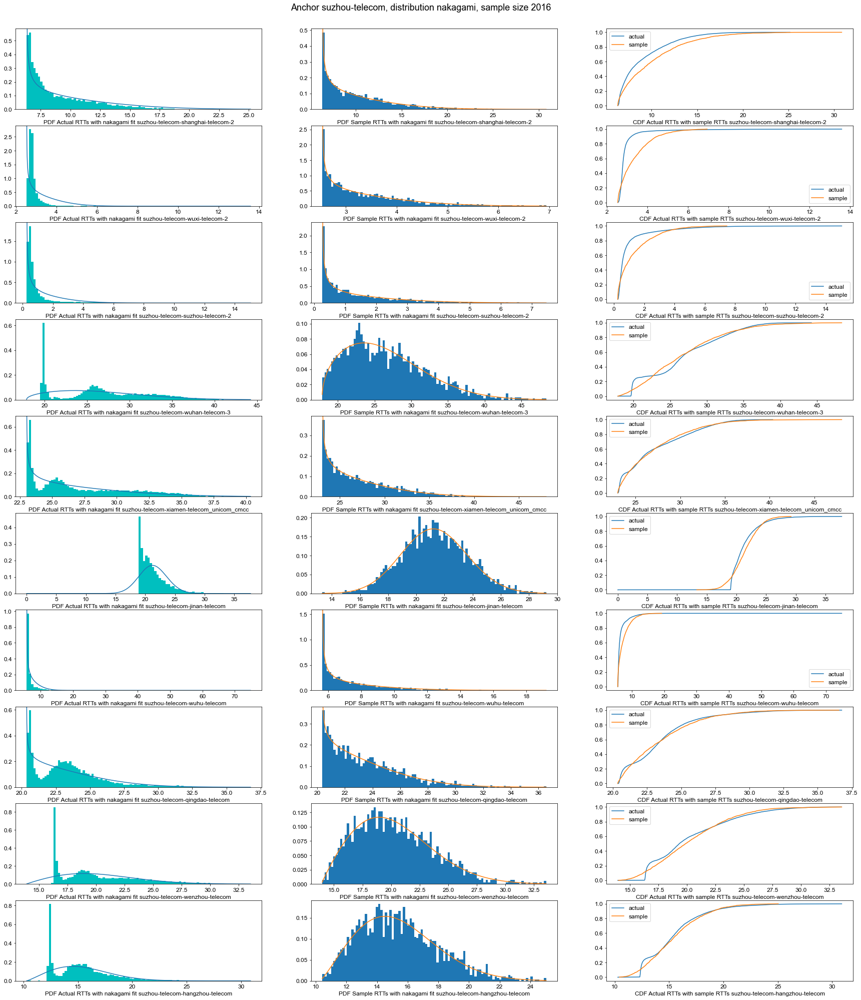

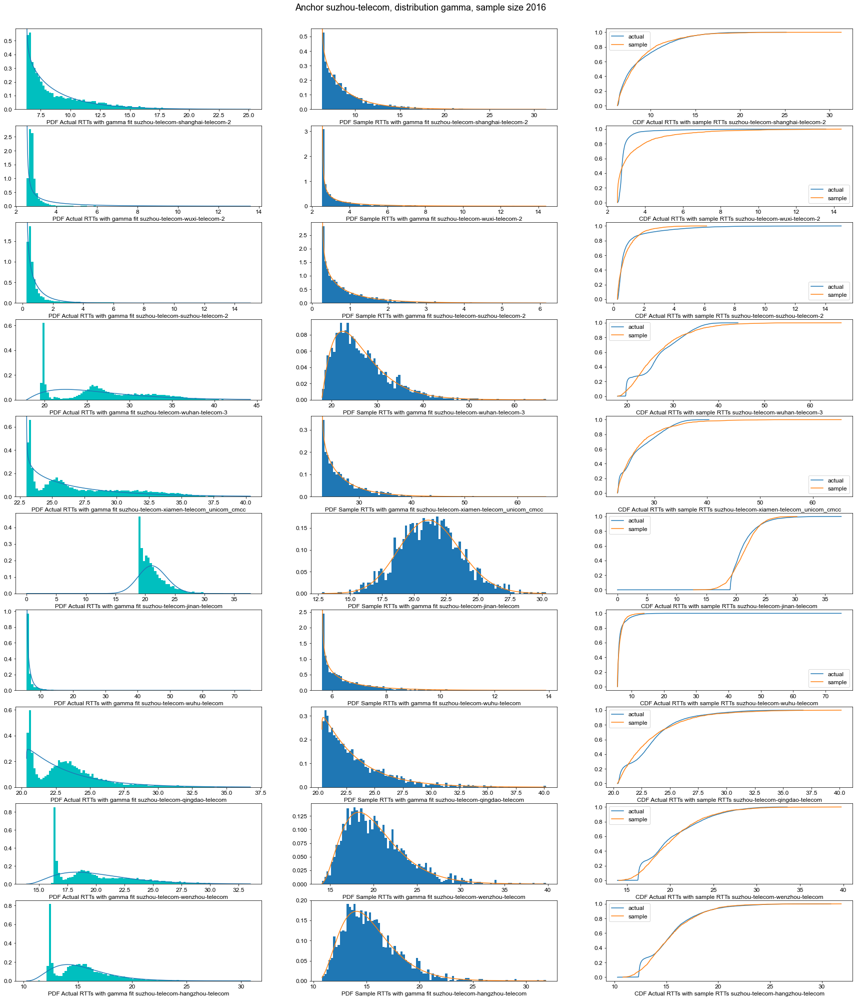

In [81]:
# edge node 3: suzhou-teleco
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "suzhou-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

for dist in dist_name:
    fig, ax = plt.subplots(10, 3, figsize=(30, 35))
    fig.suptitle(f"Anchor {dc_id}, distribution {dist}, sample size {sample_size}", fontsize=18, y=0.9)
    i = 0
    for region_index, region_id in enumerate(region_ids):
        probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
        results_per_region_pair = region_fitting_results[region_index][1]
        plot_actual_rtts_w_sample(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist, ax, i, 0, maximum_RTT)
        i += 1
    # save the plot
    plt.savefig(f"../datasets/split-rtt-files/cleandata/all-dist/0531_0607_{dist}_{dc_id}")

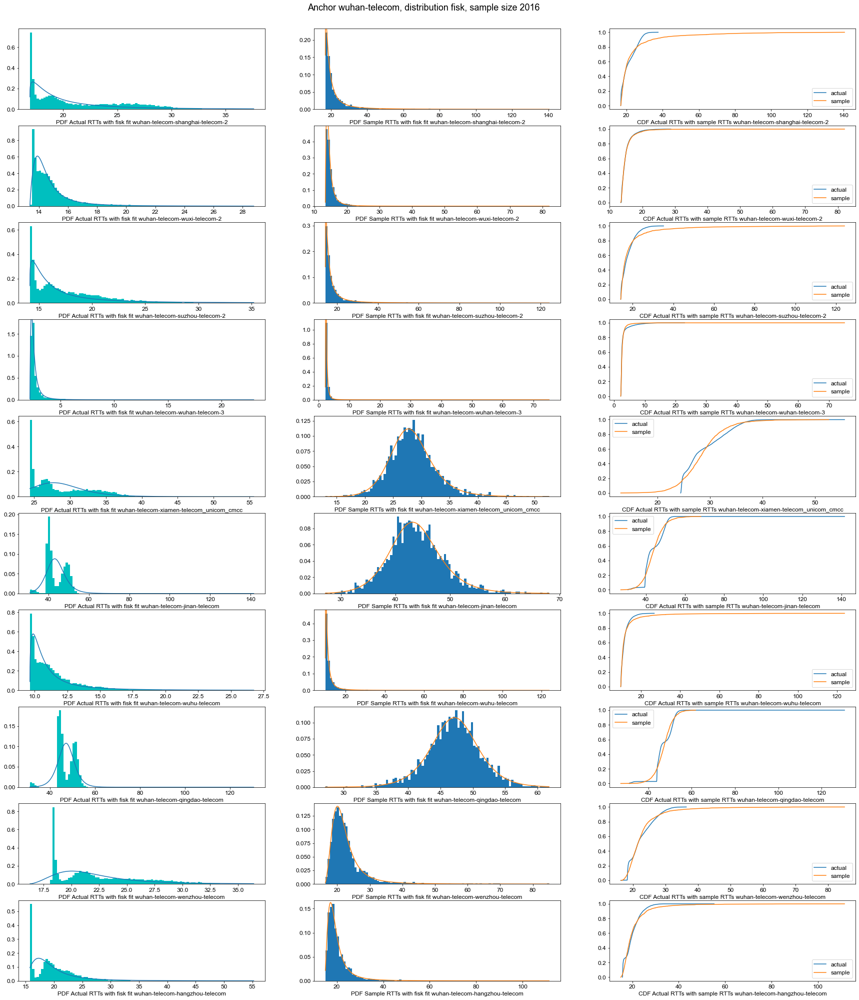

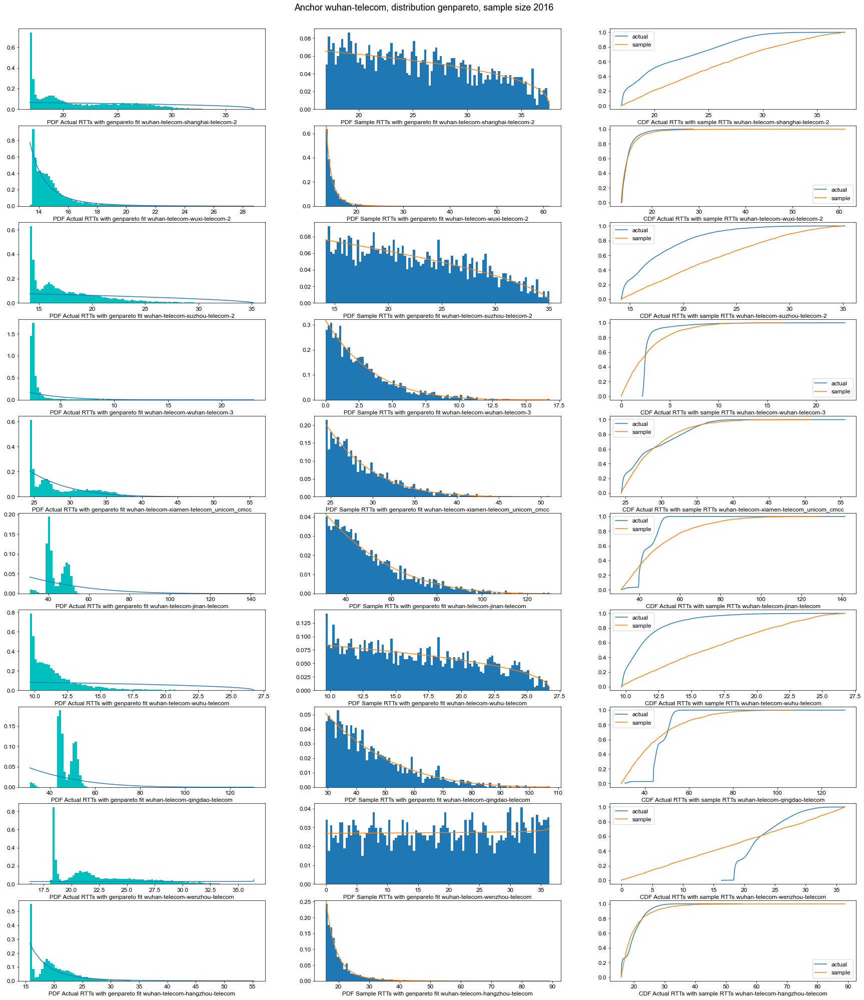

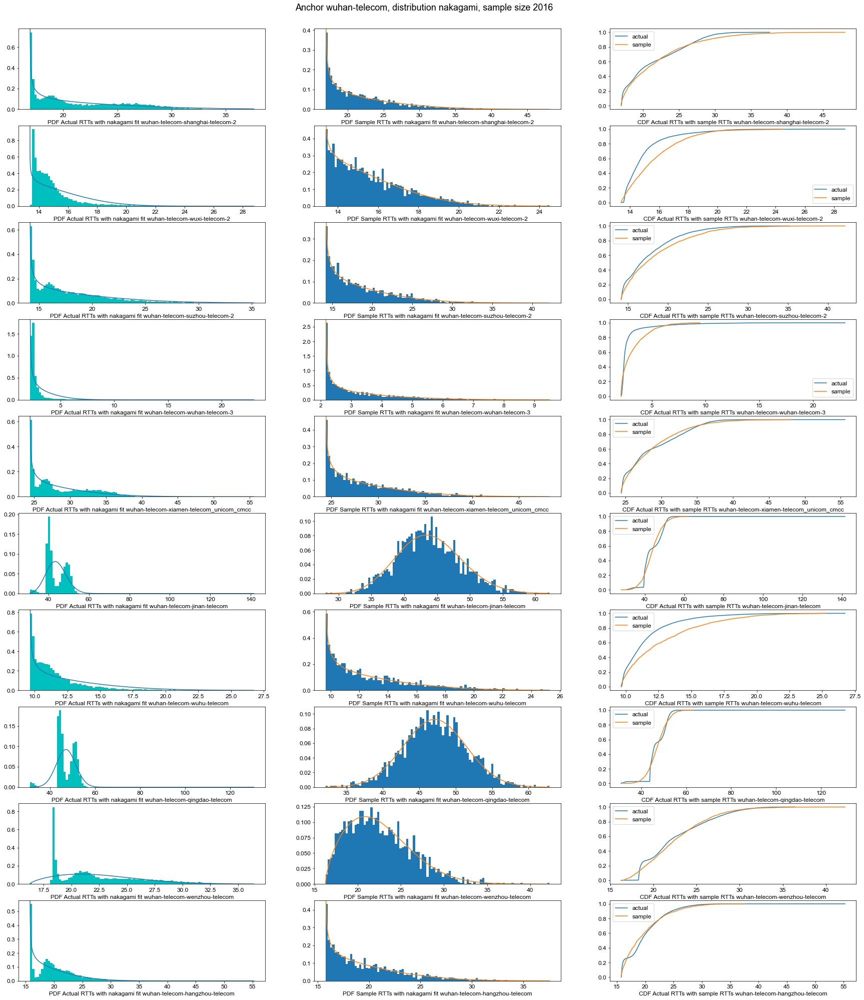

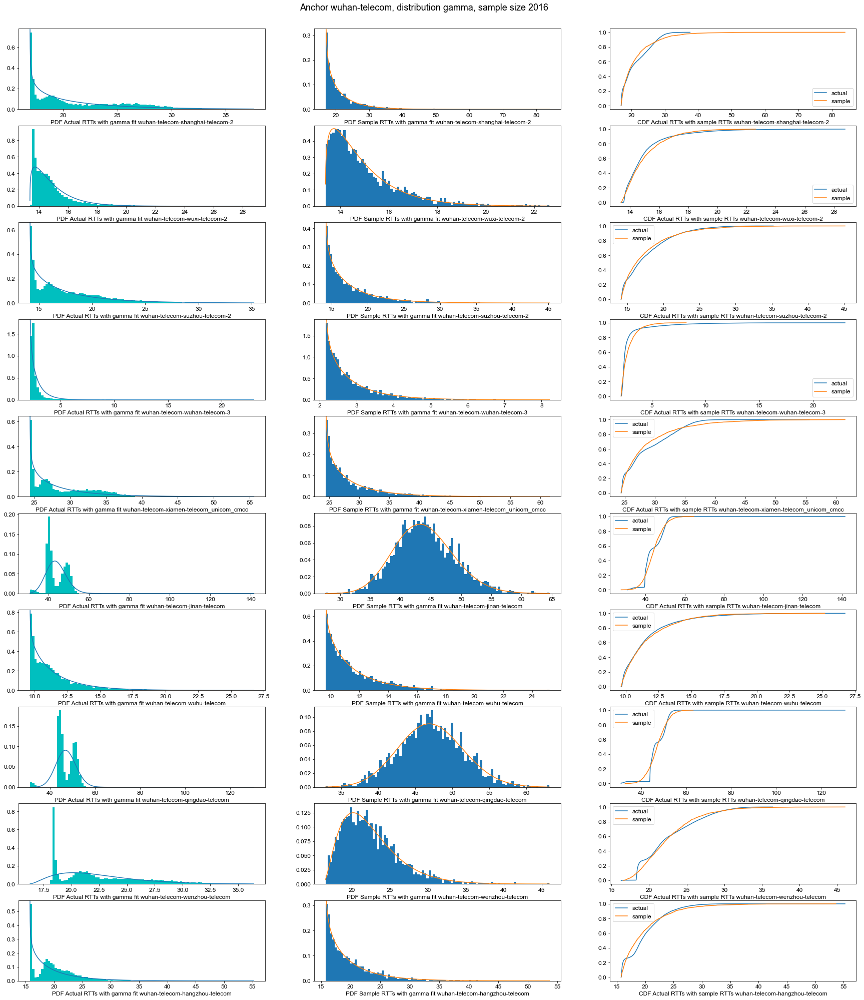

In [82]:
# edge node 4: wuhan-telecom
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "wuhan-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

for dist in dist_name:
    fig, ax = plt.subplots(10, 3, figsize=(30, 35))
    fig.suptitle(f"Anchor {dc_id}, distribution {dist}, sample size {sample_size}", fontsize=18, y=0.9)
    i = 0
    for region_index, region_id in enumerate(region_ids):
        probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
        results_per_region_pair = region_fitting_results[region_index][1]
        plot_actual_rtts_w_sample(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist, ax, i, 0, maximum_RTT)
        i += 1
    # save the plot
    plt.savefig(f"../datasets/split-rtt-files/cleandata/all-dist/0531_0607_{dist}_{dc_id}")

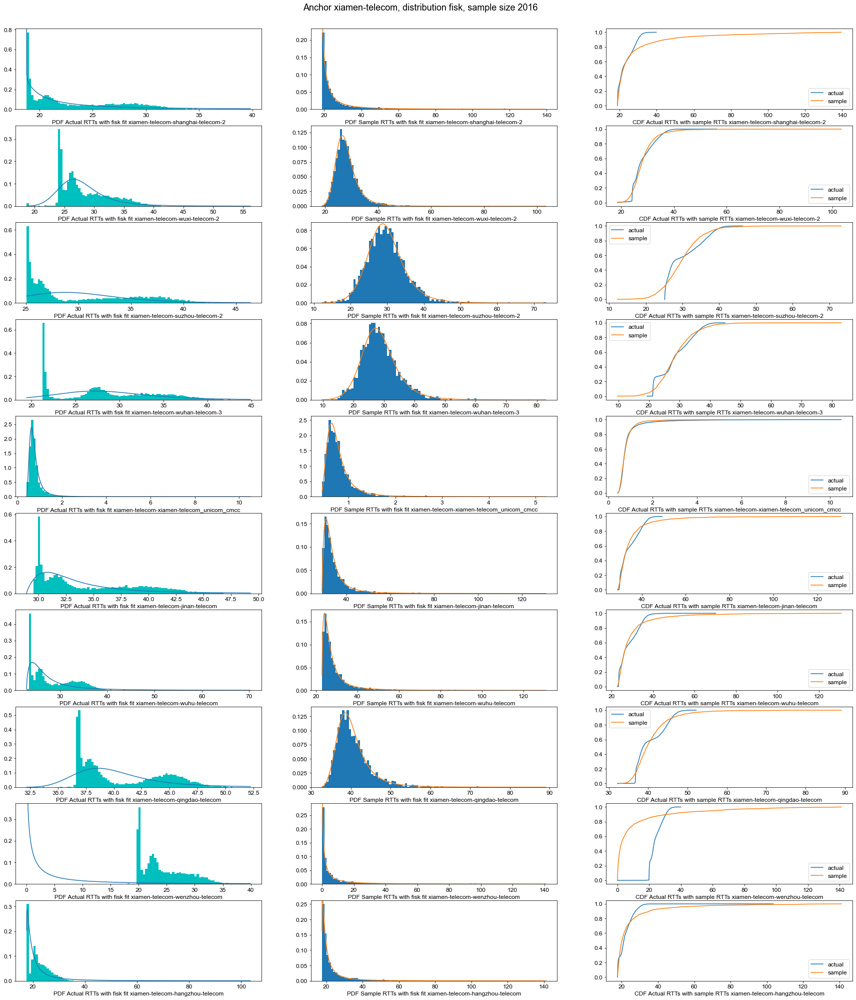

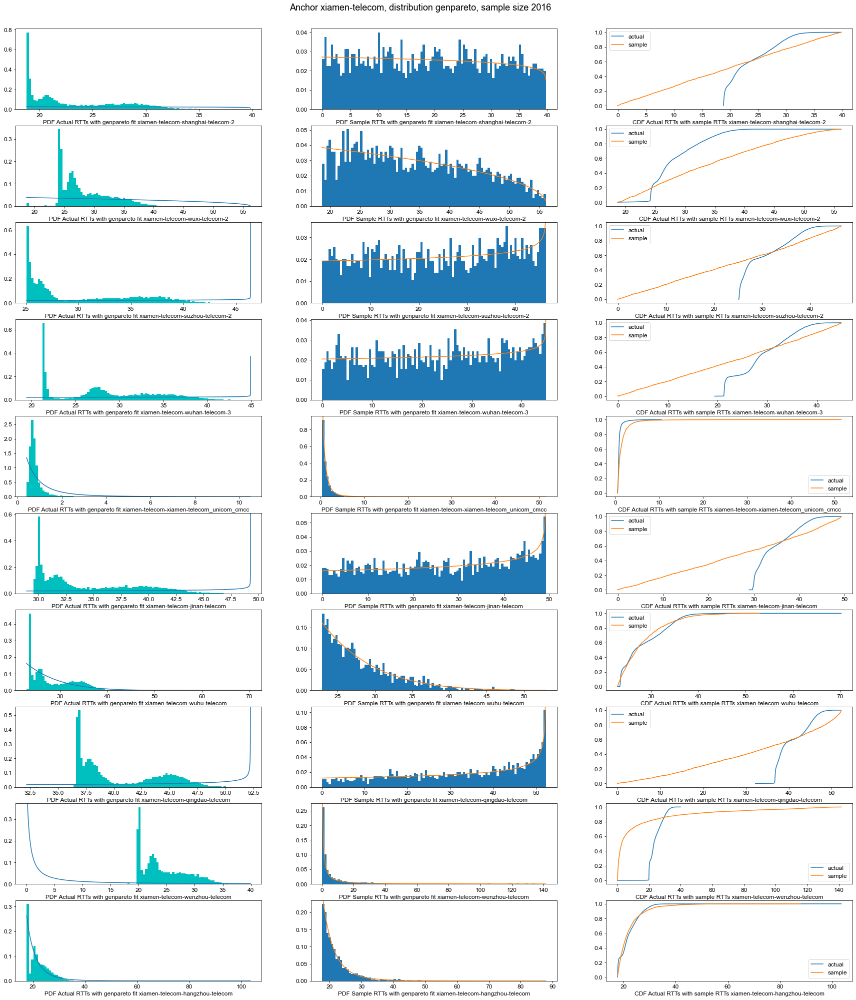

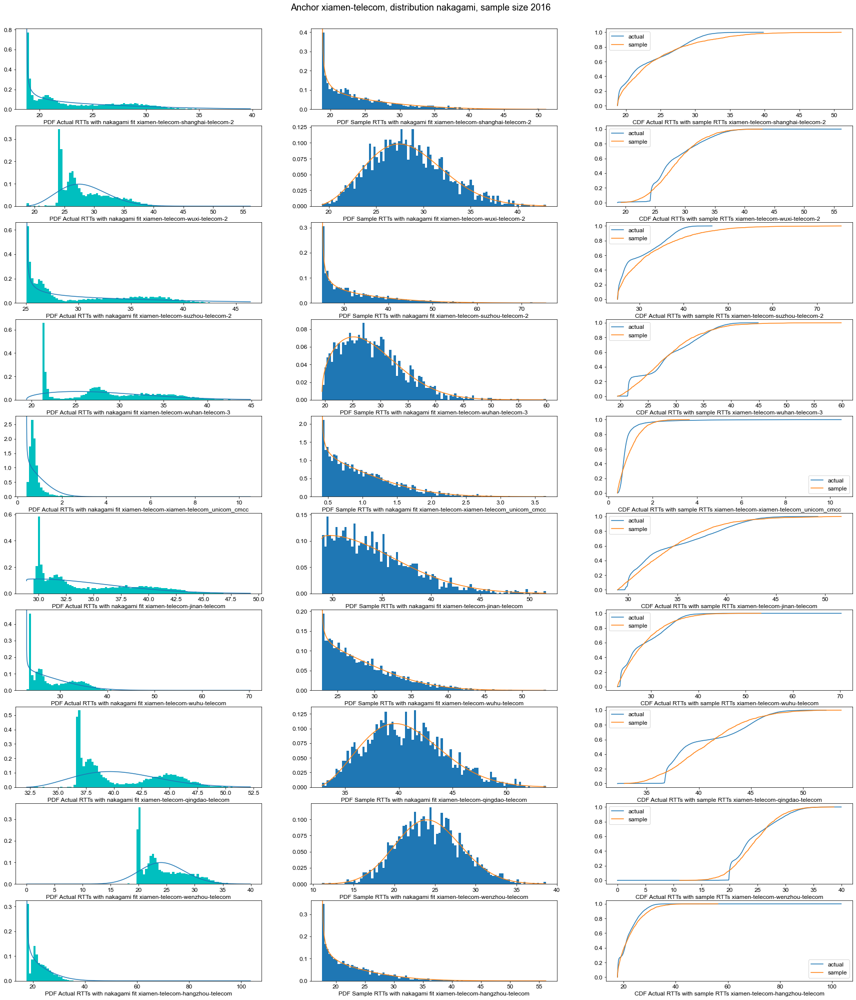

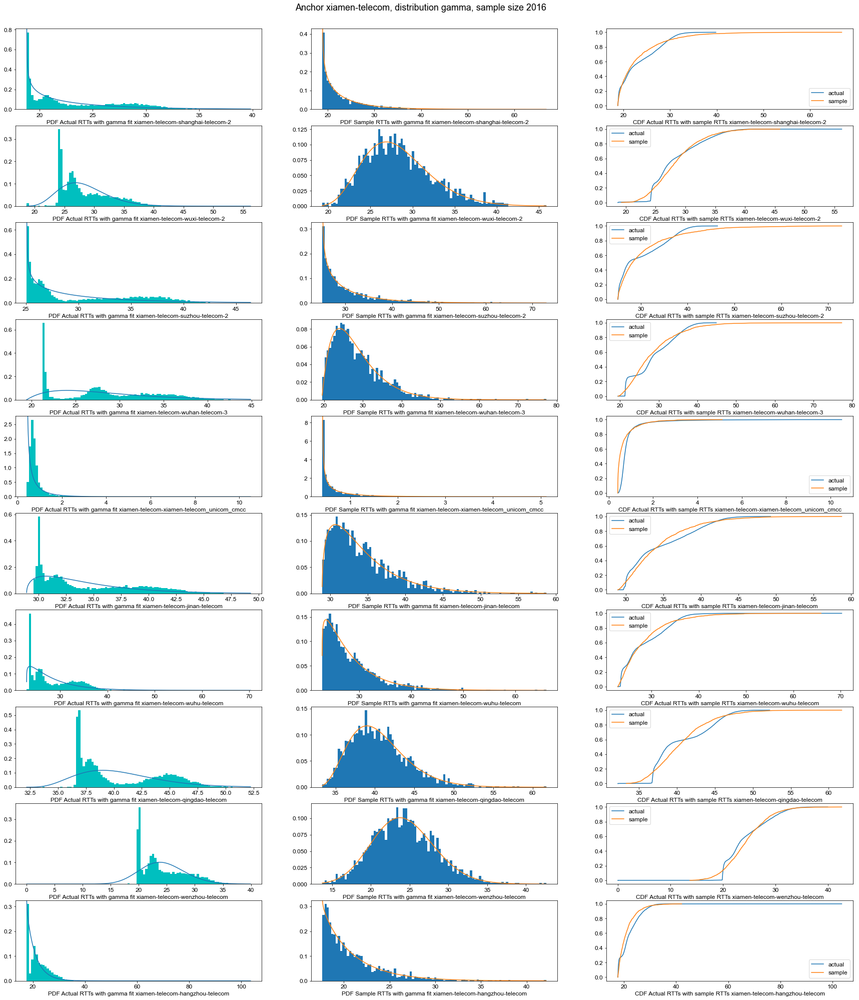

In [83]:
# edge node 5: xiamen-telecom
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "xiamen-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

for dist in dist_name:
    fig, ax = plt.subplots(10, 3, figsize=(30, 35))
    fig.suptitle(f"Anchor {dc_id}, distribution {dist}, sample size {sample_size}", fontsize=18, y=0.9)
    i = 0
    for region_index, region_id in enumerate(region_ids):
        probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
        results_per_region_pair = region_fitting_results[region_index][1]
        plot_actual_rtts_w_sample(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist, ax, i, 0, maximum_RTT)
        i += 1
    # save the plot
    plt.savefig(f"../datasets/split-rtt-files/cleandata/all-dist/0531_0607_{dist}_{dc_id}")

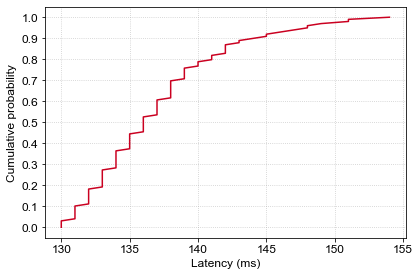

In [77]:
def plot_cdf(latency_vals, labels, linetypes, colors):
    plt.rcParams.update({'font.family': 'sans-serif'})
    plt.rcParams.update({'font.sans-serif': 'Arial'})
    plt.rcParams.update({'font.size': 12})
    fig, ax = plt.subplots()
    
    for i in range(len(latency_vals)):
        values = sorted(latency_vals[i])
        y_vals = np.arange(len(values))/float(len(values)-1)

        plt.plot(values, y_vals,
                 color=colors[i],
                 label=labels[i],
                 linestyle=linetypes[i])

    plt.yticks(ticks=np.arange(0, 1.1, 0.1))
    plt.grid(alpha=0.7, linestyle=':')
    #plt.legend()
    plt.ylabel("Cumulative probability")
    plt.xlabel("Latency (ms)")
    fig.tight_layout()
    plt.show()
    #plt.savefig("{}.png".format(filename), bbox_inches='tight', dpi=600)
    #plt.cla()
    #plt.close(fig)


# average_latency = [13, 20]
# beta = [0.2*13, 0.2*20]

average_latency = [135]
beta = [np.sqrt(0.1*135)]

latency_vals  = []
for i in range(len(average_latency)):
    vals = np.random.gumbel(average_latency[i], beta[i], 100)
    latency_vals.append(vals.astype(int))

colors = ["#ca0020", "#f4a582"]
linetypes = ["solid", "dashed"]
labels = ["Near EN", "Distant EN"]

#colors = ["#0571b0"]
#linetypes = ["solid"]
#labels = ["Cloud"]

plot_cdf(latency_vals, labels, linetypes, colors)

In [16]:
# This function is used to plot CDF and PDF for both rtt values from training data and generated data for each edge node,
# through which we can compare the accuracy of each model.

def compare_dist_cdf(anchor_region_id, probe_region_id, results_per_region_pair, probe_region_rtt_values, random_sample_size, dist_name, ax, i, sample_upper_bound=None):
    y = probe_region_rtt_values
    # Plot eCDF of actual RTTs 
    e = ECDF(y)
    ax[i].plot(e.x, e.y, label="actual")
    
    for dist in dist_name:
        dist_method = getattr(scipy.stats, dist)
        ks_statistic, p_value, arg, loc, scale = get_distribution_parameters_from_fit(dist, results_per_region_pair)

    # Fix distribution parameters
        dist_parms = dist_method(*arg, loc=loc, scale=scale)
        y = select_random_sample_w_upper_bound(dist_parms, random_sample_size, sample_upper_bound)
        e = ECDF(y)
        ax[i].plot(e.x, e.y, label = dist)
    ax[i].set_xlabel(f'CDF Actual RTTs with sample RTTs {anchor_region_id}-{probe_region_id}')
    ax[i].legend()
    

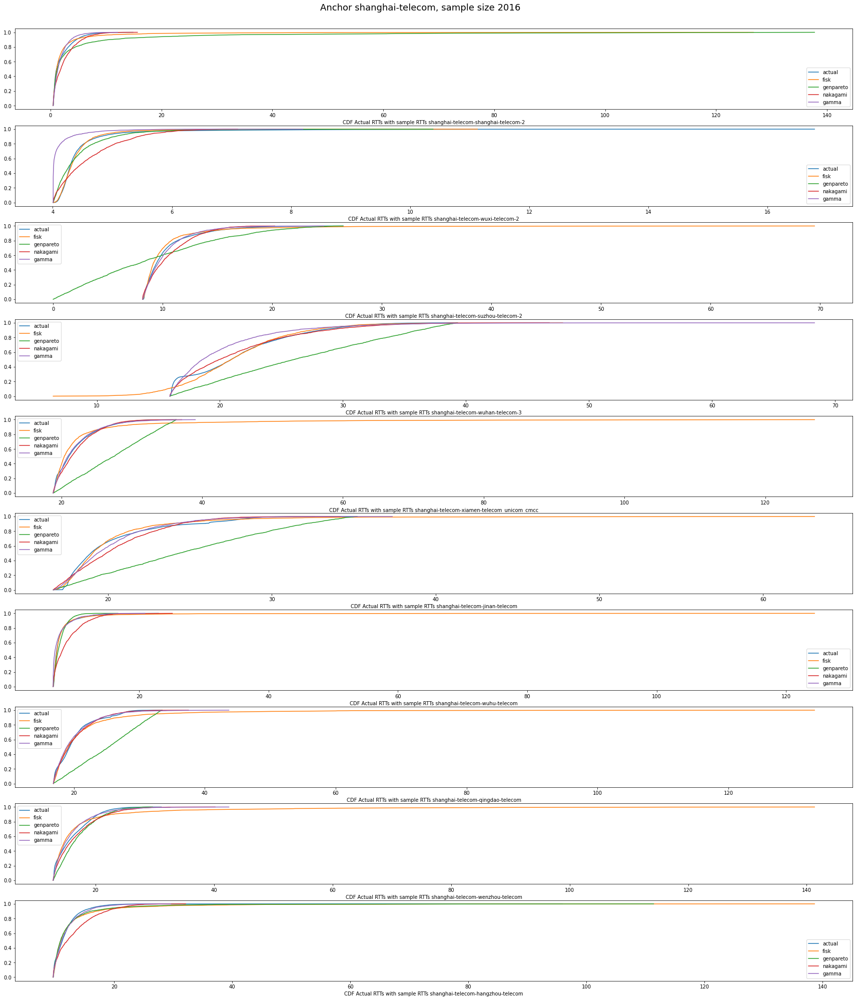

In [17]:
# edge node 1: shanghai-telecom
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "shanghai-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

fig, ax = plt.subplots(10, figsize=(30, 35))
fig.suptitle(f"Anchor {dc_id}, sample size {sample_size}", fontsize=18, y=0.9)
i = 0
for region_index, region_id in enumerate(region_ids):
    probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
    results_per_region_pair = region_fitting_results[region_index][1]
    compare_dist_cdf(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist_name, ax, i, maximum_RTT)
    i += 1


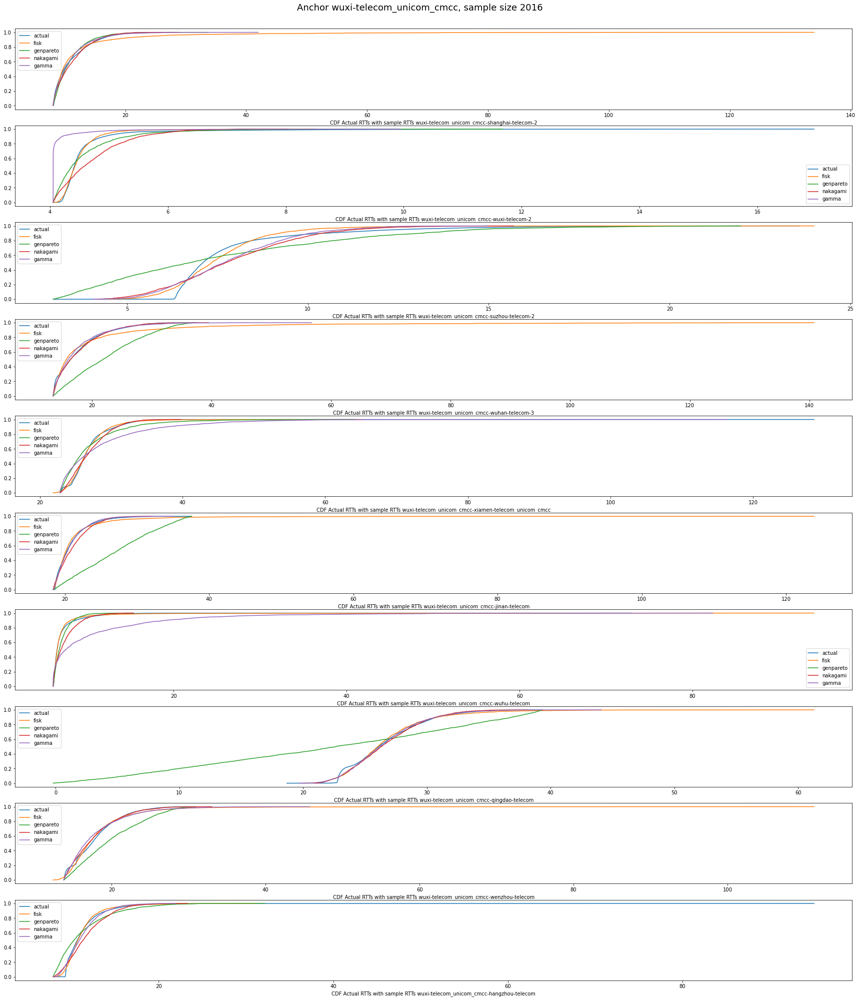

In [18]:
# edge node 2: wuxi-telecom_unicom_cmcc
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "wuxi-telecom_unicom_cmcc"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

fig, ax = plt.subplots(10, figsize=(30, 35))
fig.suptitle(f"Anchor {dc_id}, sample size {sample_size}", fontsize=18, y=0.9)
i = 0
for region_index, region_id in enumerate(region_ids):
    probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
    results_per_region_pair = region_fitting_results[region_index][1]
    compare_dist_cdf(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist_name, ax, i, maximum_RTT)
    i += 1


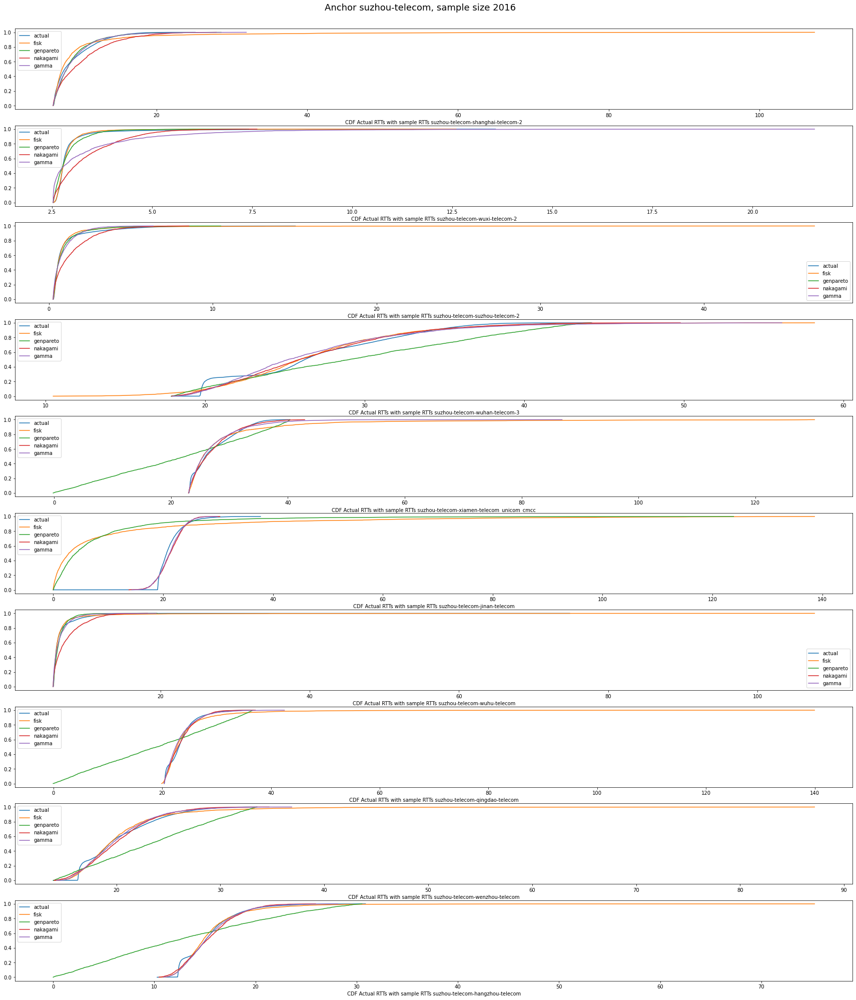

In [19]:
# edge node 3: suzhou-telecom
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "suzhou-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

fig, ax = plt.subplots(10, figsize=(30, 35))
fig.suptitle(f"Anchor {dc_id}, sample size {sample_size}", fontsize=18, y=0.9)
i = 0
for region_index, region_id in enumerate(region_ids):
    probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
    results_per_region_pair = region_fitting_results[region_index][1]
    compare_dist_cdf(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist_name, ax, i, maximum_RTT)
    i += 1


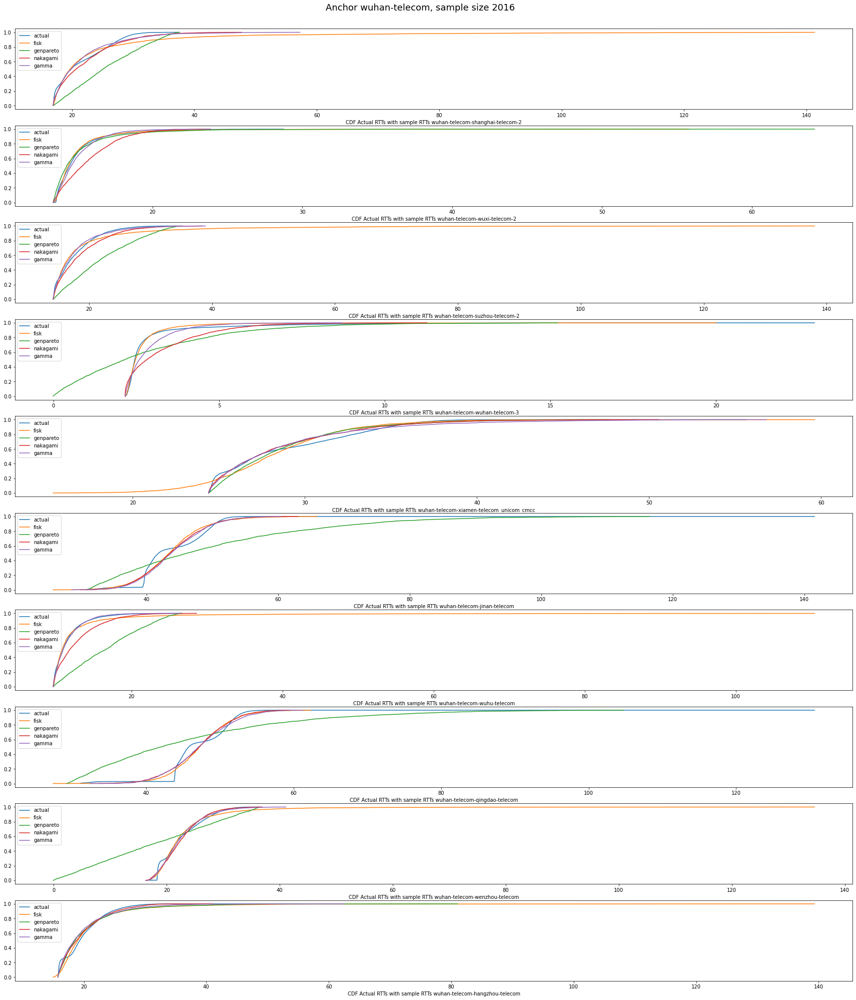

In [20]:
# edge node 4: wuhan-telecom
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "wuhan-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

fig, ax = plt.subplots(10, figsize=(30, 35))
fig.suptitle(f"Anchor {dc_id}, sample size {sample_size}", fontsize=18, y=0.9)
i = 0
for region_index, region_id in enumerate(region_ids):
    probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
    results_per_region_pair = region_fitting_results[region_index][1]
    compare_dist_cdf(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist_name, ax, i, maximum_RTT)
    i += 1


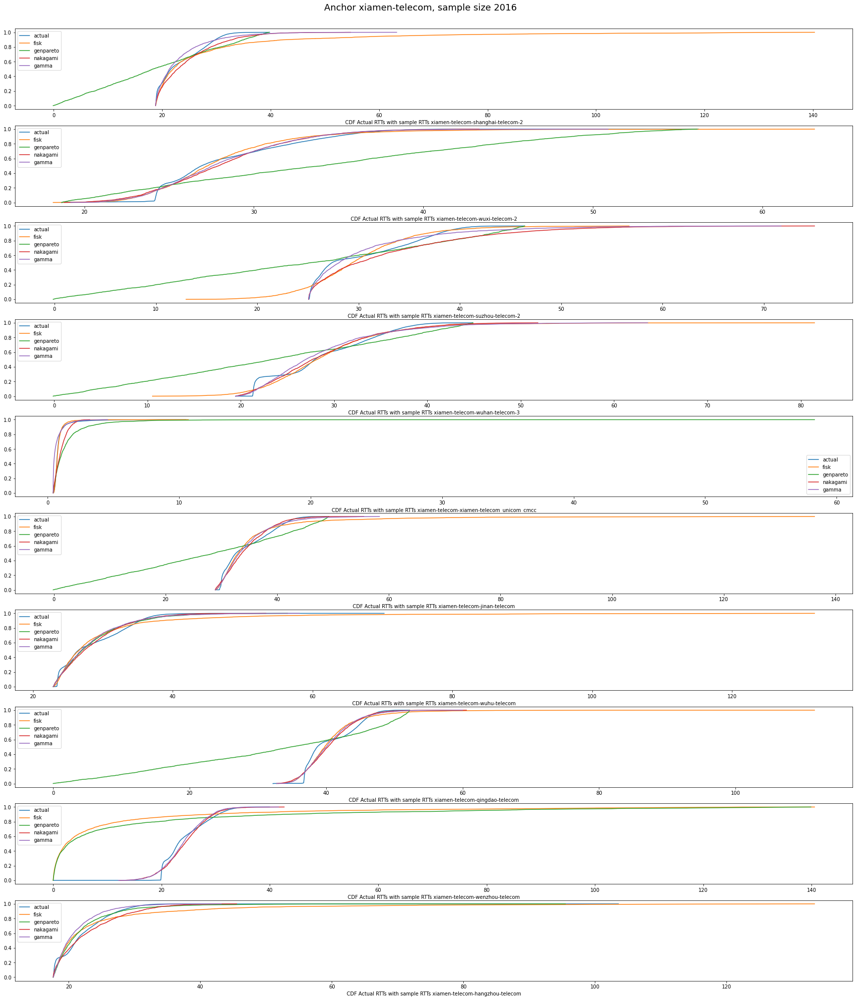

In [15]:
# edge node 5: xiamen-telecom
maximum_RTT = find_max_RTT_across_all_links()
sample_size = 2016
dc_id = "xiamen-telecom"
dist_name = ['fisk', 'genpareto', 'nakagami', 'gamma']
region_fitting_results = open_fit_results(dc_id)

fig, ax = plt.subplots(10, figsize=(30, 35))
fig.suptitle(f"Anchor {dc_id}, sample size {sample_size}", fontsize=18, y=0.9)
i = 0
for region_index, region_id in enumerate(region_ids):
    probe_region_rtt_values = get_rtt_values_for_each_pair(region_id, dc_id)
    results_per_region_pair = region_fitting_results[region_index][1]
    compare_dist_cdf(dc_id, region_id, results_per_region_pair, probe_region_rtt_values, sample_size, dist_name, ax, i, maximum_RTT)
    i += 1
